In [1]:
# Importing libraries for data manipulation
import os
import sys
import pandas as pd  
import numpy as np   

# Importing libraries for visualization
import matplotlib.pyplot as plt  
import seaborn as sns 

In [3]:
df = pd.read_csv('/Users/anamikasaroha/Energy7_Week1/week_4/cleaned_WR.csv')
df.head()

,Time,Site Name,Point Machine Name,Direction,A Current,A Voltage,B Current,B Voltage,Type of A,Type of B,Polling of A,Polling of B
0,2025-02-10 07:42:14,Atul,129/130,Reverse,"[0.0, 4.7, 4.7, 3.6, 2.9, 2.4, 2.1, 1.9, 1.9, ...","[0.0, 100.5, 102.0, 103.5, 103.5, 102.0, 102.0...","[0.0, 1.5, 4.4, 3.7, 2.9, 2.4, 2.0, 1.8, 1.6, ...","[0.0, 12.0, 58.5, 81.0, 94.5, 100.5, 102.0, 10...",TWS,TWS,100,100.0
1,2024-08-10 10:00:16,Atul,129/130,Reverse,"[0.0, 5.0, 4.2, 3.3, 2.8, 2.4, 2.1, 1.9, 1.8, ...","[0.0, 91.5, 97.5, 102.0, 105.0, 108.0, 109.5, ...","[0.0, 4.1, 3.9, 3.1, 2.5, 2.1, 1.8, 1.6, 1.6, ...","[0.0, 39.0, 70.5, 90.0, 99.0, 105.0, 108.0, 10...",TWS,TWS,100,100.0
2,2024-08-10 10:03:28,Atul,129/130,Normal,"[0.0, 1.6, 4.4, 3.6, 2.9, 2.4, 2.1, 1.9, 1.8, ...","[0.0, 16.5, 52.5, 79.5, 93.0, 100.5, 105.0, 10...","[0.0, 5.0, 4.1, 3.1, 2.4, 2.0, 1.8, 1.6, 1.5, ...","[0.0, 93.0, 99.0, 105.0, 108.0, 111.0, 112.5, ...",TWS,TWS,100,100.0
3,2024-08-10 10:28:37,Atul,129/130,Reverse,"[0.0, 4.0, 4.9, 3.9, 3.1, 2.6, 2.2, 2.0, 1.9, ...","[0.0, 97.5, 93.0, 99.0, 103.5, 106.5, 108.0, 1...","[0.0, 4.3, 3.9, 3.0, 2.4, 2.0, 1.8, 1.6, 1.6, ...","[0.0, 43.5, 73.5, 91.5, 100.5, 106.5, 109.5, 1...",TWS,TWS,100,100.0
4,2024-08-10 10:51:17,Atul,129/130,Reverse,"[0.0, 4.9, 4.5, 3.6, 2.9, 2.5, 2.1, 1.9, 1.9, ...","[0.0, 91.5, 96.0, 100.5, 105.0, 106.5, 109.5, ...","[0.0, 4.0, 4.0, 3.2, 2.6, 2.1, 1.8, 1.7, 1.6, ...","[0.0, 36.0, 69.0, 88.5, 99.0, 105.0, 108.0, 10...",TWS,TWS,100,100.0


In [8]:
# Get unique point machines
unique_values = df['Point Machine Name'].unique()
unique_values

array(['129/130', '159/160', 'PT 101 - 102', 'PT 111 - 112',
       'PT 119 - 120', 'PT 135 - 136', 'PT 157 - 158', 'PT 189 - 190',
       'PT-101/102', 'PT-109/110', 'PT-119/120', 'PT-121/122',
       'PT-103/104', 'PT-129/130', 'PT101/102', 'PT119/120'], dtype=object)

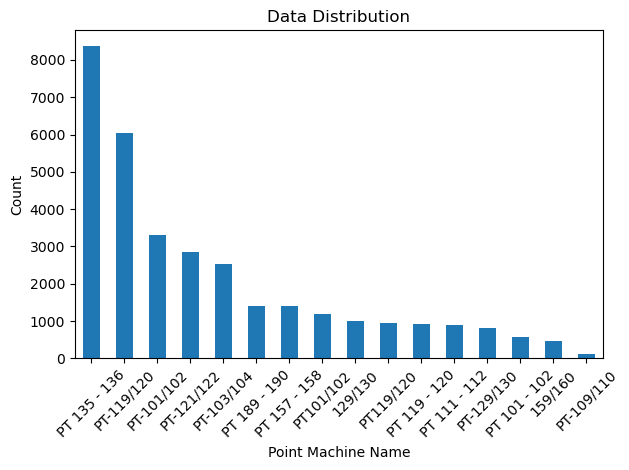

In [12]:
df['Point Machine Name'].value_counts().plot(kind='bar')
plt.xlabel('Point Machine Name')
plt.ylabel('Count')
plt.title('Data Distribution')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [9]:
value_counts = df['Point Machine Name'].value_counts()
value_counts

Point Machine Name
PT 135 - 136    8375
PT-119/120      6045
PT-101/102      3301
PT-121/122      2852
PT-103/104      2528
PT 189 - 190    1406
PT 157 - 158    1403
PT101/102       1184
129/130         1011
PT119/120        955
PT 119 - 120     913
PT 111 - 112     898
PT-129/130       808
PT 101 - 102     577
159/160          468
PT-109/110       117
Name: count, dtype: int64

In [10]:
# Sample 100 instances per machine (or all if <100)
sampled_data = []

for machine in unique_values:
    # Filter data for the current machine
    machine_data = df[df['Point Machine Name'] == machine]
    
    # If a timestamp exists, sort by time first
    if 'Time' in df.columns:
        machine_data = machine_data.sort_values('Time')
    
    # Take the first 100 records (or all if fewer than 100)
    sampled_machine = machine_data.head(100)
    sampled_data.append(sampled_machine)

# Combine all samples into one DataFrame
new_df = pd.concat(sampled_data).reset_index(drop=True)

# Check the counts
print("Samples per machine:")
print(new_df['Point Machine Name'].value_counts())

Samples per machine:
Point Machine Name
129/130         100
159/160         100
PT 101 - 102    100
PT 111 - 112    100
PT 119 - 120    100
PT 135 - 136    100
PT 157 - 158    100
PT 189 - 190    100
PT-101/102      100
PT-109/110      100
PT-119/120      100
PT-121/122      100
PT-103/104      100
PT-129/130      100
PT101/102       100
PT119/120       100
Name: count, dtype: int64


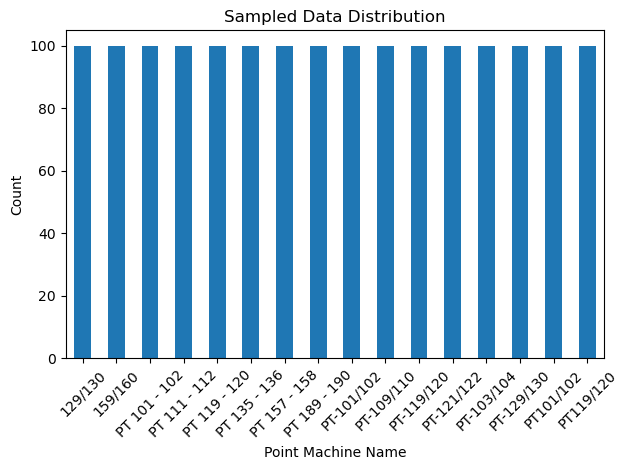

In [11]:
new_df['Point Machine Name'].value_counts().plot(kind='bar')
plt.xlabel('Point Machine Name')
plt.ylabel('Count')
plt.title('Sampled Data Distribution')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [13]:
new_df.head()

,Time,Site Name,Point Machine Name,Direction,A Current,A Voltage,B Current,B Voltage,Type of A,Type of B,Polling of A,Polling of B
0,2024-08-10 10:00:16,Atul,129/130,Reverse,"[0.0, 5.0, 4.2, 3.3, 2.8, 2.4, 2.1, 1.9, 1.8, ...","[0.0, 91.5, 97.5, 102.0, 105.0, 108.0, 109.5, ...","[0.0, 4.1, 3.9, 3.1, 2.5, 2.1, 1.8, 1.6, 1.6, ...","[0.0, 39.0, 70.5, 90.0, 99.0, 105.0, 108.0, 10...",TWS,TWS,100,100.0
1,2024-08-10 10:03:28,Atul,129/130,Normal,"[0.0, 1.6, 4.4, 3.6, 2.9, 2.4, 2.1, 1.9, 1.8, ...","[0.0, 16.5, 52.5, 79.5, 93.0, 100.5, 105.0, 10...","[0.0, 5.0, 4.1, 3.1, 2.4, 2.0, 1.8, 1.6, 1.5, ...","[0.0, 93.0, 99.0, 105.0, 108.0, 111.0, 112.5, ...",TWS,TWS,100,100.0
2,2024-08-10 10:28:37,Atul,129/130,Reverse,"[0.0, 4.0, 4.9, 3.9, 3.1, 2.6, 2.2, 2.0, 1.9, ...","[0.0, 97.5, 93.0, 99.0, 103.5, 106.5, 108.0, 1...","[0.0, 4.3, 3.9, 3.0, 2.4, 2.0, 1.8, 1.6, 1.6, ...","[0.0, 43.5, 73.5, 91.5, 100.5, 106.5, 109.5, 1...",TWS,TWS,100,100.0
3,2024-08-10 10:32:50,Atul,129/130,Normal,"[0.0, 3.7, 4.2, 3.4, 2.8, 2.3, 2.0, 1.9, 1.8, ...","[0.0, 28.5, 64.5, 85.5, 97.5, 103.5, 108.0, 10...","[0.0, 3.7, 4.8, 3.8, 2.9, 2.3, 1.9, 1.7, 1.6, ...","[0.0, 100.5, 94.5, 100.5, 105.0, 106.5, 109.5,...",TWS,TWS,100,100.0
4,2024-08-10 10:51:17,Atul,129/130,Reverse,"[0.0, 4.9, 4.5, 3.6, 2.9, 2.5, 2.1, 1.9, 1.9, ...","[0.0, 91.5, 96.0, 100.5, 105.0, 106.5, 109.5, ...","[0.0, 4.0, 4.0, 3.2, 2.6, 2.1, 1.8, 1.7, 1.6, ...","[0.0, 36.0, 69.0, 88.5, 99.0, 105.0, 108.0, 10...",TWS,TWS,100,100.0


In [14]:
new_df.shape

(1600, 12)

In [19]:
new_df.isnull().sum()

Time                  0
Site Name             0
Point Machine Name    0
Direction             0
A Current             0
A Voltage             0
B Current             0
B Voltage             0
Type of A             0
Type of B             0
Polling of A          0
Polling of B          0
dtype: int64

In [15]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1600 entries, 0 to 1599
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Time                1600 non-null   object 
 1   Site Name           1600 non-null   object 
 2   Point Machine Name  1600 non-null   object 
 3   Direction           1600 non-null   object 
 4   A Current           1600 non-null   object 
 5   A Voltage           1600 non-null   object 
 6   B Current           1600 non-null   object 
 7   B Voltage           1600 non-null   object 
 8   Type of A           1600 non-null   object 
 9   Type of B           1600 non-null   object 
 10  Polling of A        1600 non-null   int64  
 11  Polling of B        1600 non-null   float64
dtypes: float64(1), int64(1), object(10)
memory usage: 150.1+ KB


# Feature Extraction 

In [18]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
import seaborn as sns

def extract_features(series):
    """Extract features from a time-series array"""
    if isinstance(series, str):
        try:
            series = eval(series)  # Convert string representation to list
        except:
            series = [float(x) for x in series.strip('[]').split(',')]  # Alternative parsing
    arr = np.array(series)
    
    # Handle empty arrays
    if len(arr) == 0:
        return {k: np.nan for k in ['mean', 'std', 'max', 'min', 'range', 'slope', 'energy', 'kurtosis', 'skewness', 'rms']}
    
    return {
        'mean': np.nanmean(arr),
        'std': np.nanstd(arr),
        'max': np.nanmax(arr),
        'min': np.nanmin(arr),
        'range': np.nanmax(arr) - np.nanmin(arr),
        'slope': (arr[-1] - arr[0])/len(arr) if len(arr) > 1 else 0,
        'energy': np.nansum(arr**2),
        'kurtosis': pd.Series(arr).kurtosis(),
        'skewness': pd.Series(arr).skew(),
        'rms': np.sqrt(np.nanmean(arr**2))
    }

def preprocess_data(df):
    # Extract features for each current/voltage series
    features = []
    for _, row in df.iterrows():
        try:
            a_current_features = extract_features(row['A Current'])
            a_voltage_features = extract_features(row['A Voltage'])
            b_current_features = extract_features(row['B Current'])
            b_voltage_features = extract_features(row['B Voltage'])
            
            # Combine all features with metadata
            combined = {
                'Point Machine Name': row['Point Machine Name'],
                'Direction': row['Direction'],
                **{f'A_Current_{k}': v for k, v in a_current_features.items()},
                **{f'A_Voltage_{k}': v for k, v in a_voltage_features.items()},
                **{f'B_Current_{k}': v for k, v in b_current_features.items()},
                **{f'B_Voltage_{k}': v for k, v in b_voltage_features.items()}
            }
            features.append(combined)
        except Exception as e:
            print(f"Error processing row {_}: {e}")
            continue
    
    feature_df = pd.DataFrame(features)
    
    # Add advanced features
    feature_df['A_Current_Voltage_Ratio'] = feature_df['A_Current_mean'] / (feature_df['A_Voltage_mean'] + 1e-6)
    feature_df['B_Current_Voltage_Ratio'] = feature_df['B_Current_mean'] / (feature_df['B_Voltage_mean'] + 1e-6)
    feature_df['Current_Diff'] = feature_df['A_Current_mean'] - feature_df['B_Current_mean']
    feature_df['Voltage_Diff'] = feature_df['A_Voltage_mean'] - feature_df['B_Voltage_mean']
    
    return feature_df

In [21]:
def cluster_per_machine(feature_df, n_clusters=3):
    results = {}
    unique_machines = feature_df['Point Machine Name'].unique()
    
    for machine in unique_machines:
        try:
            # Filter data for current machine
            machine_data = feature_df[feature_df['Point Machine Name'] == machine].copy()
            
            # Select only numerical features and drop columns with all NaN
            X = machine_data.select_dtypes(include=[np.number])
            X = X.dropna(axis=1, how='all')
            
            # Drop rows with any remaining NaN values
            X = X.dropna()
            if len(X) == 0:
                print(f"Skipping {machine} - no valid data after NaN removal")
                continue
                
            # Standardize features with imputation
            scaler = StandardScaler()
            imputer = SimpleImputer(strategy='mean')
            
            X_imputed = imputer.fit_transform(X)
            X_scaled = scaler.fit_transform(X_imputed)
            
            # Perform K-means clustering
            kmeans = KMeans(n_clusters=min(n_clusters, len(X_scaled)-1), random_state=42)
            clusters = kmeans.fit_predict(X_scaled)
            
            # Store results
            results[machine] = {
                'model': kmeans,
                'scaler': scaler,
                'imputer': imputer,
                'cluster_labels': clusters,
                'feature_importance': pd.DataFrame({
                    'feature': X.columns,
                    'importance': np.abs(kmeans.cluster_centers_).mean(axis=0)
                }).sort_values('importance', ascending=False)
            }
            
            # Add cluster labels to original data
            valid_indices = X.index
            feature_df.loc[valid_indices, 'Cluster'] = clusters
            
        except Exception as e:
            print(f"Error clustering {machine}: {e}")
            continue
    
    return feature_df, results

In [22]:
# Process your dataframe
print("Starting feature extraction...")
feature_df = preprocess_data(new_df)

Starting feature extraction...


In [23]:
print("\nStarting clustering...")
clustered_df, cluster_results = cluster_per_machine(feature_df, n_clusters=3)


Starting clustering...


/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/

In [24]:
print("\nClustering completed. Results summary:")
for machine, result in cluster_results.items():
    print(f"\n{machine}: Found {len(np.unique(result['cluster_labels']))} clusters")
    print("Top features:")
    print(result['feature_importance'].head(5))


Clustering completed. Results summary:

129/130: Found 3 clusters
Top features:
           feature  importance
9    A_Current_rms    3.127763
0   A_Current_mean    3.020680
2    A_Current_max    2.964922
4  A_Current_range    2.870167
1    A_Current_std    2.715579

159/160: Found 3 clusters
Top features:
                    feature  importance
15          A_Voltage_slope    0.922654
35          B_Voltage_slope    0.879702
43             Voltage_Diff    0.877861
16         A_Voltage_energy    0.858846
41  B_Current_Voltage_Ratio    0.855954

PT 101 - 102: Found 3 clusters
Top features:
                    feature  importance
6          A_Current_energy    1.231744
9             A_Current_rms    1.230231
0            A_Current_mean    1.203230
40  A_Current_Voltage_Ratio    1.157279
8        A_Current_skewness    1.109877

PT 111 - 112: Found 3 clusters
Top features:
           feature  importance
1    A_Current_std    2.758985
9    A_Current_rms    2.623154
42    Current_Diff    2.567

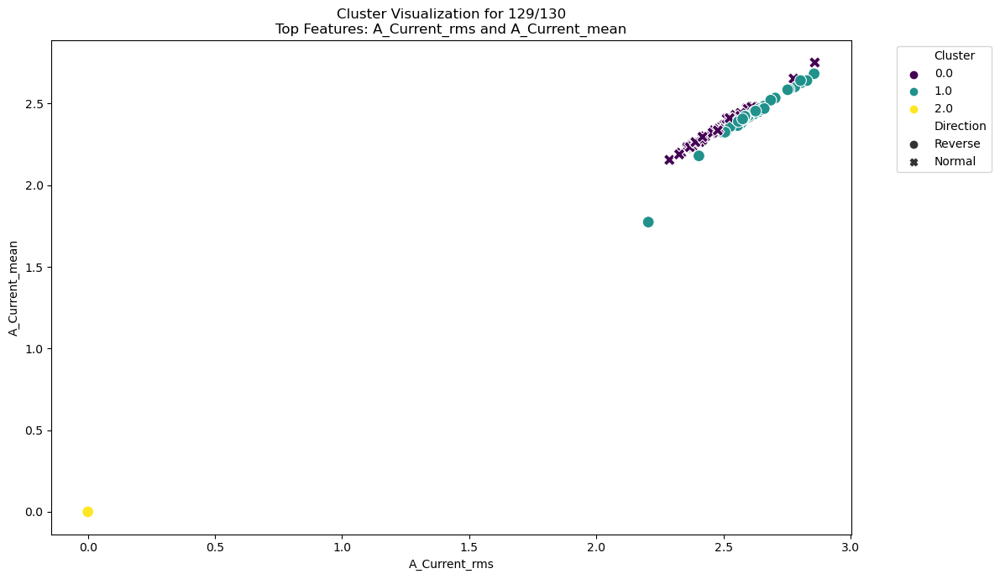


Cluster characteristics for 129/130:

Cluster 0.0 (n=46):
Direction distribution:
Direction
Normal    46
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_rms     2.480555
A_Current_mean    2.350810
dtype: float64

Cluster 1.0 (n=53):
Direction distribution:
Direction
Reverse    53
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_rms     2.613302
A_Current_mean    2.432393
dtype: float64

Cluster 2.0 (n=1):
Direction distribution:
Direction
Reverse    1
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_rms     0.0
A_Current_mean    0.0
dtype: float64


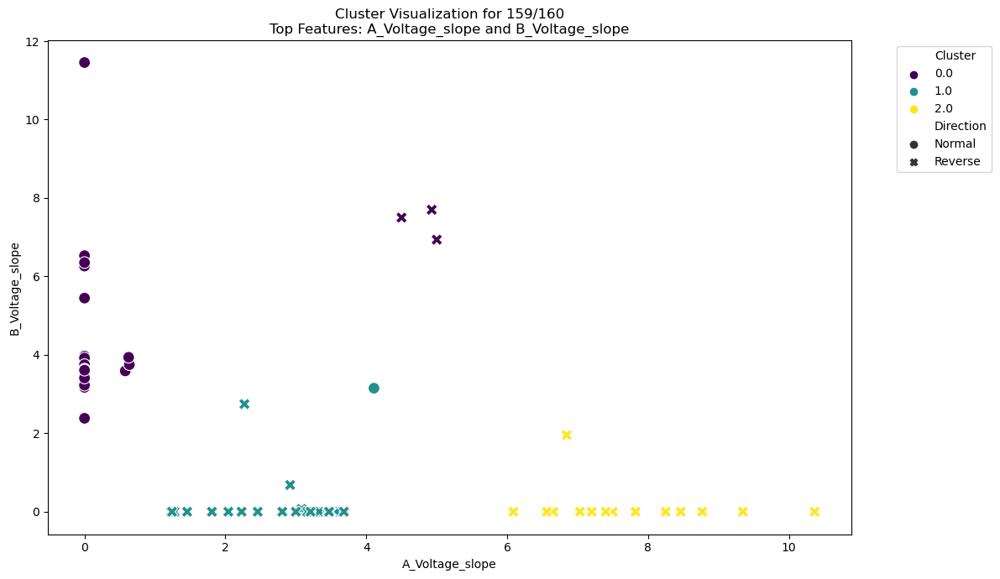


Cluster characteristics for 159/160:

Cluster 0.0 (n=53):
Direction distribution:
Direction
Normal     50
Reverse     3
Name: count, dtype: int64

Mean values of top 5 features:
B_Voltage_slope    4.236864
A_Voltage_slope    0.306986
dtype: float64

Cluster 1.0 (n=30):
Direction distribution:
Direction
Reverse    29
Normal      1
Name: count, dtype: int64

Mean values of top 5 features:
A_Voltage_slope    2.854545
B_Voltage_slope    0.221656
dtype: float64

Cluster 2.0 (n=17):
Direction distribution:
Direction
Reverse    17
Name: count, dtype: int64

Mean values of top 5 features:
A_Voltage_slope    7.618492
B_Voltage_slope    0.114973
dtype: float64


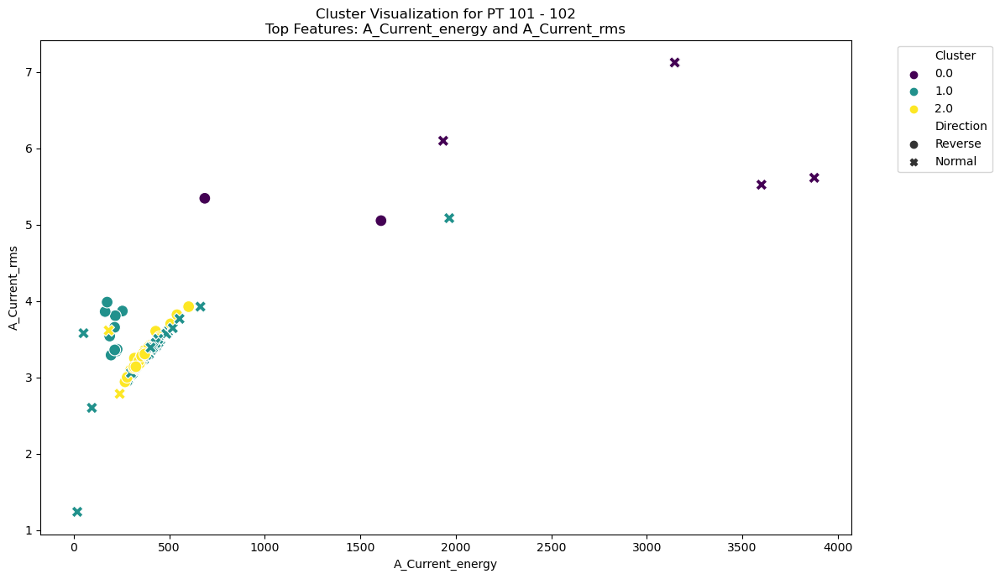


Cluster characteristics for PT 101 - 102:

Cluster 0.0 (n=6):
Direction distribution:
Direction
Normal     4
Reverse    2
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_energy    2475.470000
A_Current_rms          5.793379
dtype: float64

Cluster 1.0 (n=52):
Direction distribution:
Direction
Normal     42
Reverse    10
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_energy    368.730962
A_Current_rms         3.361734
dtype: float64

Cluster 2.0 (n=42):
Direction distribution:
Direction
Reverse    40
Normal      2
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_energy    362.647619
A_Current_rms         3.305366
dtype: float64


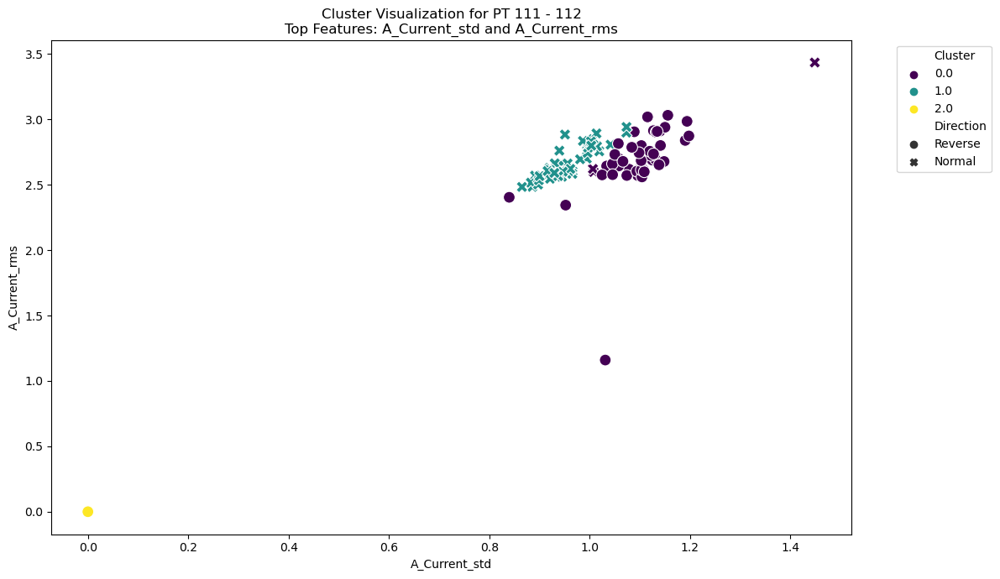


Cluster characteristics for PT 111 - 112:

Cluster 0.0 (n=52):
Direction distribution:
Direction
Reverse    49
Normal      3
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_rms    2.699962
A_Current_std    1.097098
dtype: float64

Cluster 1.0 (n=47):
Direction distribution:
Direction
Normal    47
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_rms    2.662936
A_Current_std    0.954609
dtype: float64

Cluster 2.0 (n=1):
Direction distribution:
Direction
Reverse    1
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_std    0.0
A_Current_rms    0.0
dtype: float64


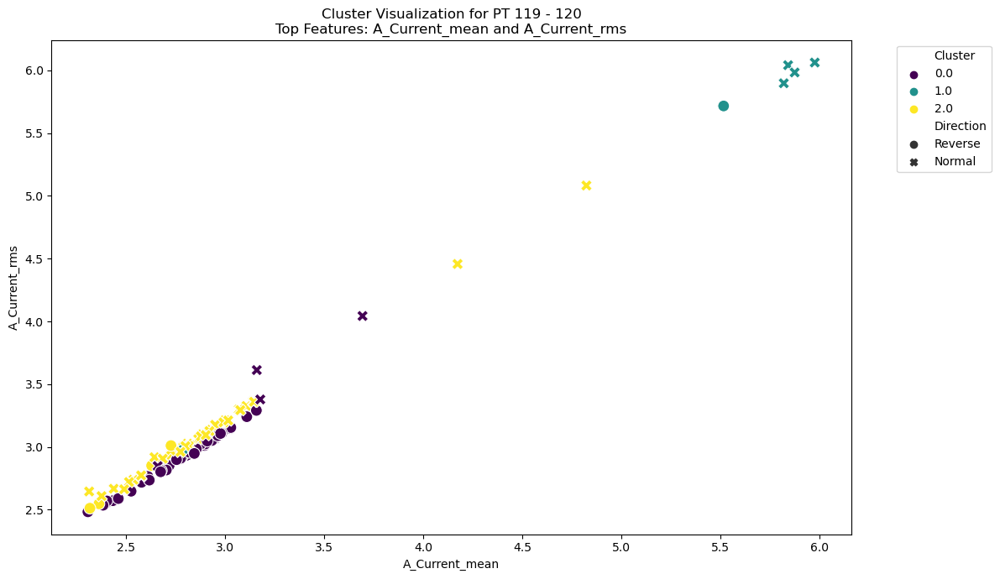


Cluster characteristics for PT 119 - 120:

Cluster 0.0 (n=44):
Direction distribution:
Direction
Reverse    40
Normal      4
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_rms     2.953377
A_Current_mean    2.806627
dtype: float64

Cluster 1.0 (n=6):
Direction distribution:
Direction
Normal     4
Reverse    2
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_rms     5.446445
A_Current_mean    5.301413
dtype: float64

Cluster 2.0 (n=50):
Direction distribution:
Direction
Normal     46
Reverse     4
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_rms     3.076304
A_Current_mean    2.862367
dtype: float64


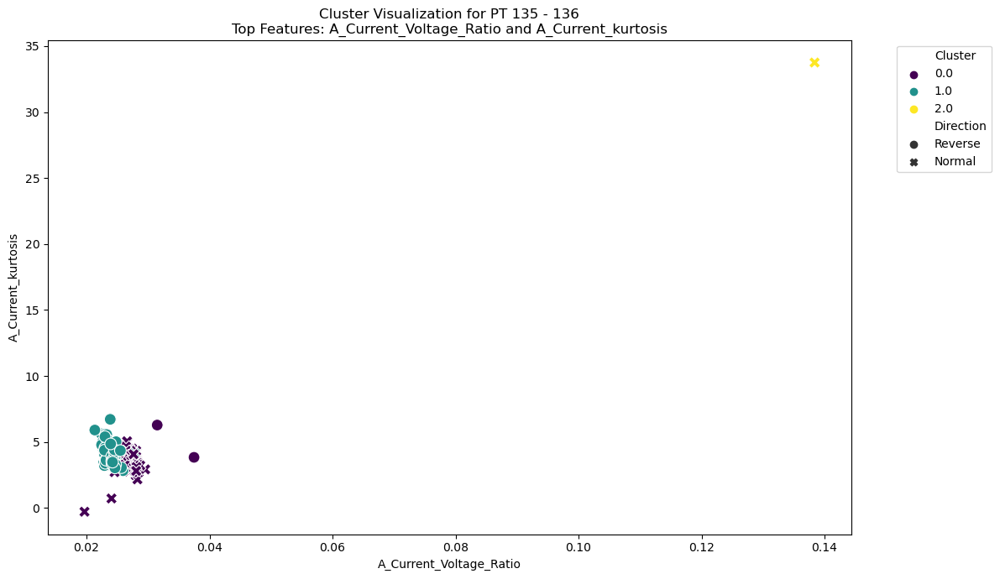


Cluster characteristics for PT 135 - 136:

Cluster 0.0 (n=49):
Direction distribution:
Direction
Normal     47
Reverse     2
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_kurtosis         3.480362
A_Current_Voltage_Ratio    0.027412
dtype: float64

Cluster 1.0 (n=49):
Direction distribution:
Direction
Reverse    48
Normal      1
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_kurtosis         4.139406
A_Current_Voltage_Ratio    0.023847
dtype: float64

Cluster 2.0 (n=1):
Direction distribution:
Direction
Normal    1
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_kurtosis         33.753853
A_Current_Voltage_Ratio     0.138387
dtype: float64


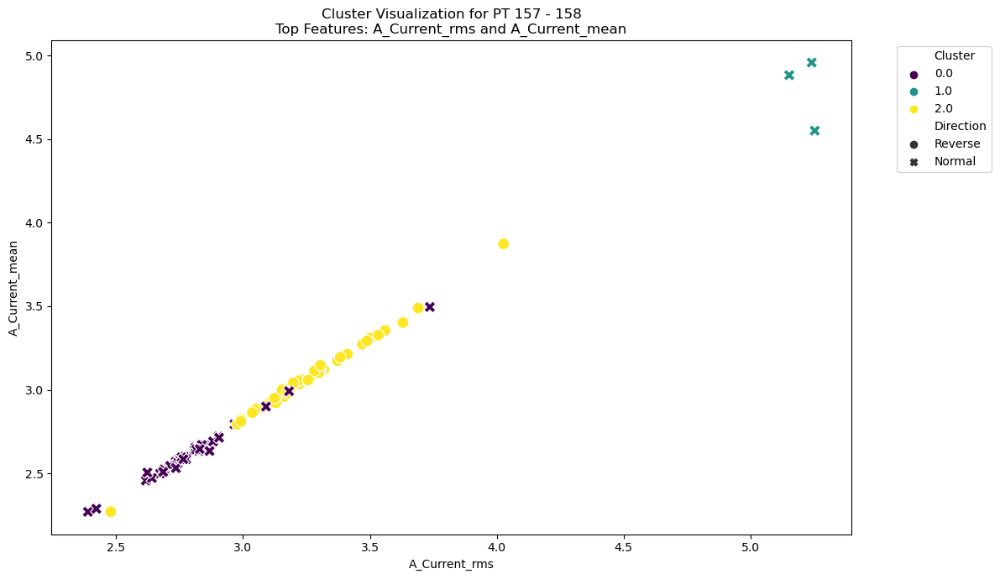


Cluster characteristics for PT 157 - 158:

Cluster 0.0 (n=46):
Direction distribution:
Direction
Normal    46
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_rms     2.782765
A_Current_mean    2.608624
dtype: float64

Cluster 1.0 (n=4):
Direction distribution:
Direction
Normal    4
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_rms     5.200745
A_Current_mean    4.817763
dtype: float64

Cluster 2.0 (n=50):
Direction distribution:
Direction
Reverse    50
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_rms     3.249448
A_Current_mean    3.064179
dtype: float64


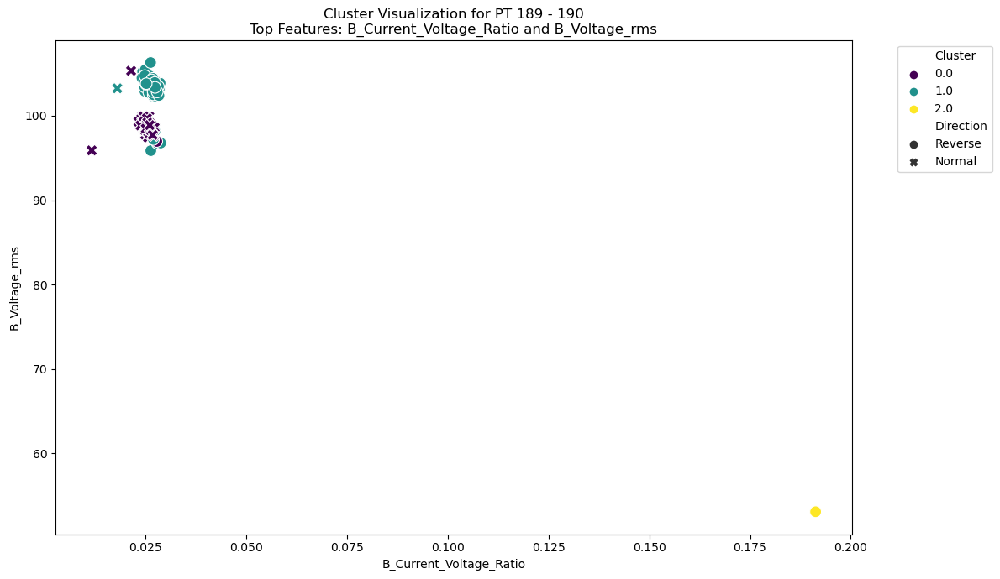


Cluster characteristics for PT 189 - 190:

Cluster 0.0 (n=45):
Direction distribution:
Direction
Normal     44
Reverse     1
Name: count, dtype: int64

Mean values of top 5 features:
B_Voltage_rms              98.834916
B_Current_Voltage_Ratio     0.024949
dtype: float64

Cluster 1.0 (n=52):
Direction distribution:
Direction
Reverse    51
Normal      1
Name: count, dtype: int64

Mean values of top 5 features:
B_Voltage_rms              103.123873
B_Current_Voltage_Ratio      0.026206
dtype: float64

Cluster 2.0 (n=1):
Direction distribution:
Direction
Reverse    1
Name: count, dtype: int64

Mean values of top 5 features:
B_Voltage_rms              53.066144
B_Current_Voltage_Ratio     0.191281
dtype: float64


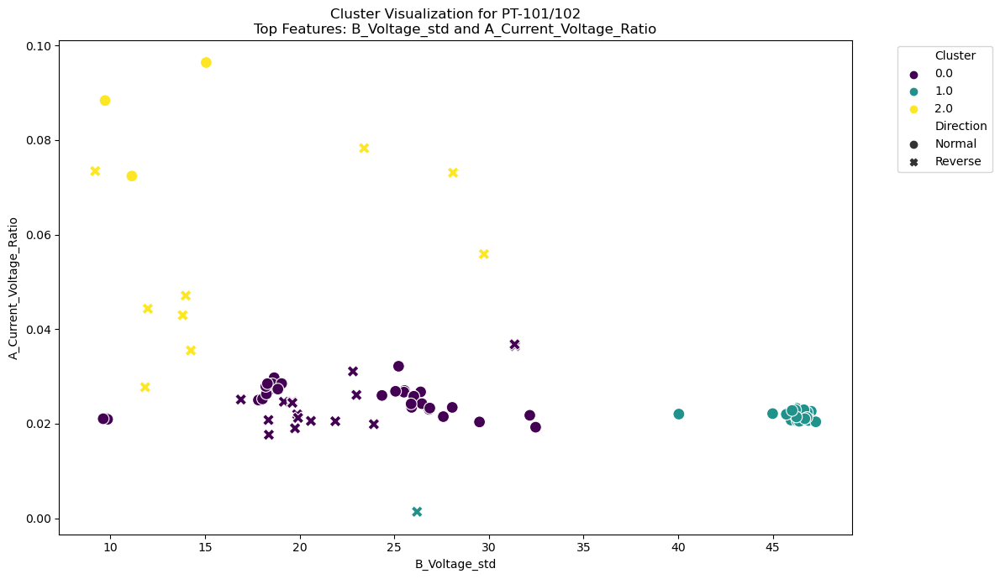


Cluster characteristics for PT-101/102:

Cluster 0.0 (n=47):
Direction distribution:
Direction
Normal     31
Reverse    16
Name: count, dtype: int64

Mean values of top 5 features:
B_Voltage_std              22.252780
A_Current_Voltage_Ratio     0.024889
dtype: float64

Cluster 1.0 (n=41):
Direction distribution:
Direction
Normal     40
Reverse     1
Name: count, dtype: int64

Mean values of top 5 features:
B_Voltage_std              45.801485
A_Current_Voltage_Ratio     0.021177
dtype: float64

Cluster 2.0 (n=12):
Direction distribution:
Direction
Reverse    9
Normal     3
Name: count, dtype: int64

Mean values of top 5 features:
B_Voltage_std              16.020470
A_Current_Voltage_Ratio     0.061273
dtype: float64


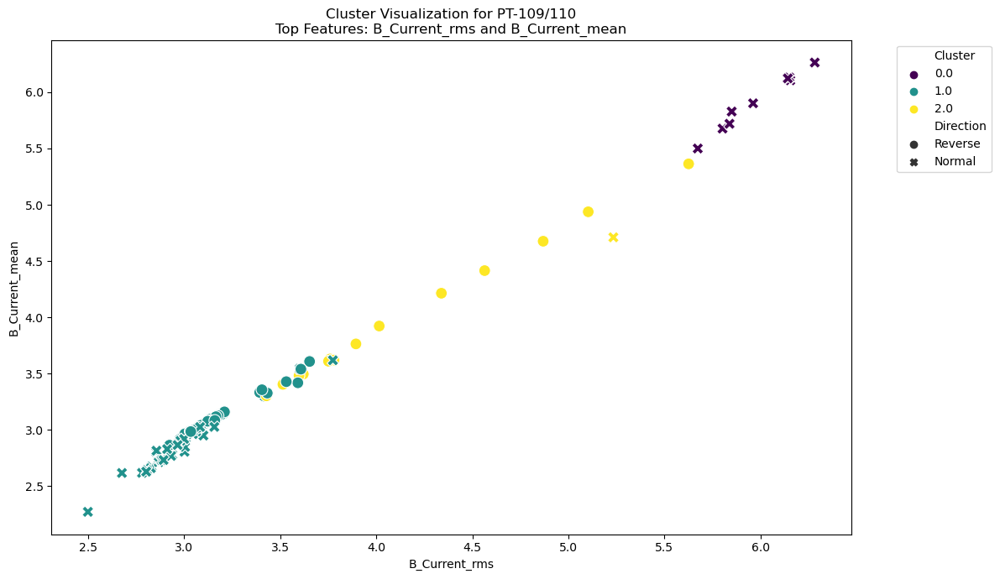


Cluster characteristics for PT-109/110:

Cluster 0.0 (n=9):
Direction distribution:
Direction
Normal    9
Name: count, dtype: int64

Mean values of top 5 features:
B_Current_rms     5.983630
B_Current_mean    5.916937
dtype: float64

Cluster 1.0 (n=71):
Direction distribution:
Direction
Reverse    36
Normal     35
Name: count, dtype: int64

Mean values of top 5 features:
B_Current_rms     3.077568
B_Current_mean    2.986619
dtype: float64

Cluster 2.0 (n=15):
Direction distribution:
Direction
Reverse    14
Normal      1
Name: count, dtype: int64

Mean values of top 5 features:
B_Current_rms     4.205919
B_Current_mean    4.036521
dtype: float64


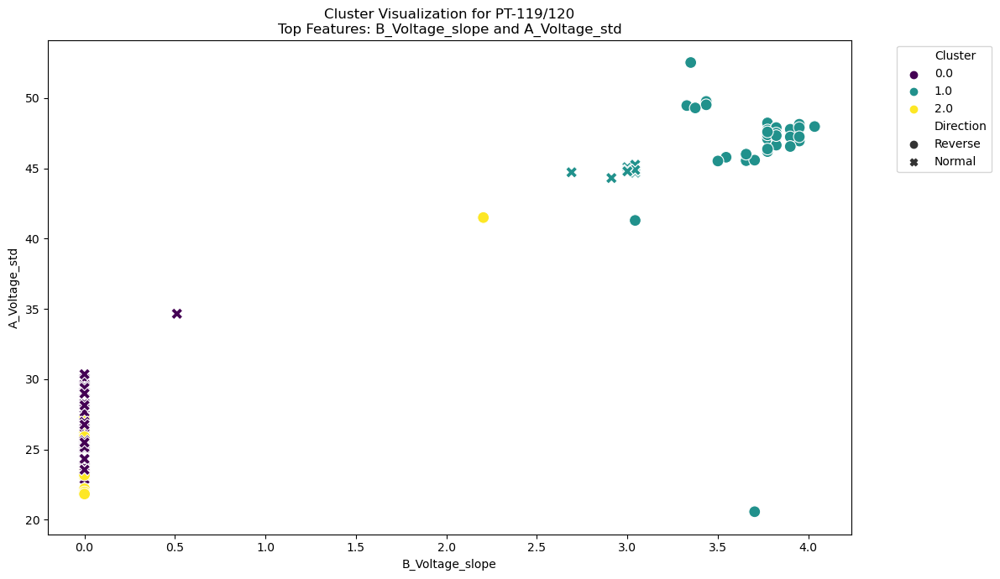


Cluster characteristics for PT-119/120:

Cluster 0.0 (n=40):
Direction distribution:
Direction
Normal    40
Name: count, dtype: int64

Mean values of top 5 features:
A_Voltage_std      26.697917
B_Voltage_slope     0.012770
dtype: float64

Cluster 1.0 (n=50):
Direction distribution:
Direction
Reverse    41
Normal      9
Name: count, dtype: int64

Mean values of top 5 features:
A_Voltage_std      46.424970
B_Voltage_slope     3.596478
dtype: float64

Cluster 2.0 (n=10):
Direction distribution:
Direction
Reverse    10
Name: count, dtype: int64

Mean values of top 5 features:
A_Voltage_std      25.661913
B_Voltage_slope     0.220408
dtype: float64


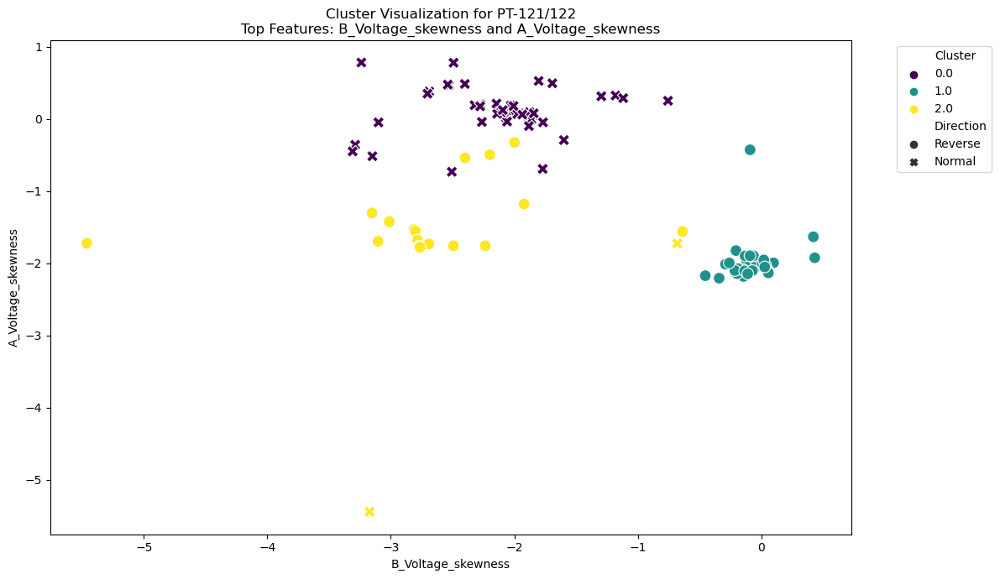


Cluster characteristics for PT-121/122:

Cluster 0.0 (n=48):
Direction distribution:
Direction
Normal    48
Name: count, dtype: int64

Mean values of top 5 features:
A_Voltage_skewness    0.104740
B_Voltage_skewness   -2.125769
dtype: float64

Cluster 1.0 (n=32):
Direction distribution:
Direction
Reverse    32
Name: count, dtype: int64

Mean values of top 5 features:
B_Voltage_skewness   -0.072173
A_Voltage_skewness   -1.967464
dtype: float64

Cluster 2.0 (n=19):
Direction distribution:
Direction
Reverse    17
Normal      2
Name: count, dtype: int64

Mean values of top 5 features:
A_Voltage_skewness   -1.627957
B_Voltage_skewness   -2.583504
dtype: float64


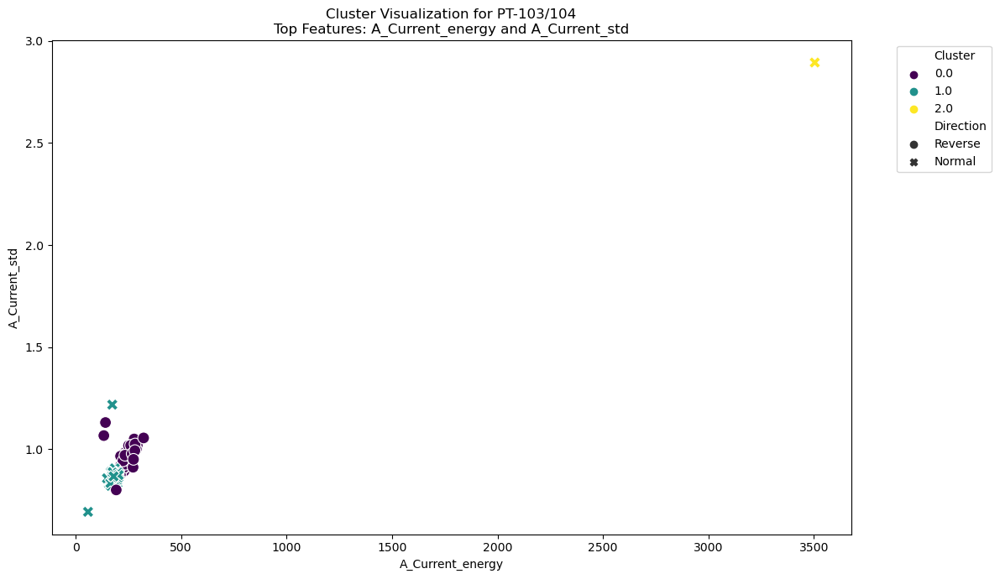


Cluster characteristics for PT-103/104:

Cluster 0.0 (n=51):
Direction distribution:
Direction
Reverse    51
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_energy    241.691961
A_Current_std         0.963219
dtype: float64

Cluster 1.0 (n=48):
Direction distribution:
Direction
Normal    48
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_energy    173.788958
A_Current_std         0.859743
dtype: float64

Cluster 2.0 (n=1):
Direction distribution:
Direction
Normal    1
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_energy    3504.4600
A_Current_std          2.8945
dtype: float64


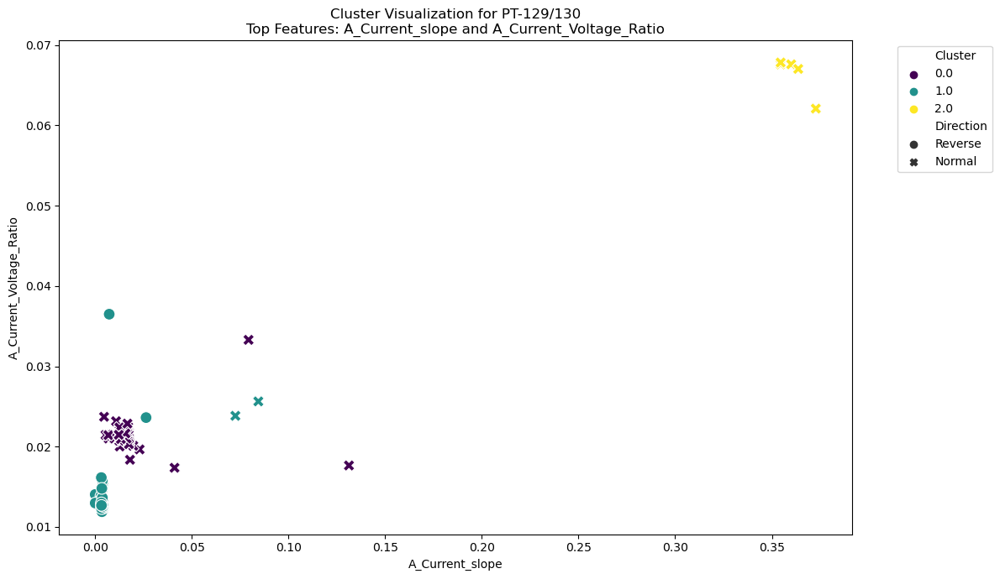


Cluster characteristics for PT-129/130:

Cluster 0.0 (n=47):
Direction distribution:
Direction
Normal    47
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_Voltage_Ratio    0.021295
A_Current_slope            0.017938
dtype: float64

Cluster 1.0 (n=48):
Direction distribution:
Direction
Reverse    46
Normal      2
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_Voltage_Ratio    0.014360
A_Current_slope            0.007041
dtype: float64

Cluster 2.0 (n=5):
Direction distribution:
Direction
Normal    5
Name: count, dtype: int64

Mean values of top 5 features:
A_Current_slope            0.361091
A_Current_Voltage_Ratio    0.066440
dtype: float64


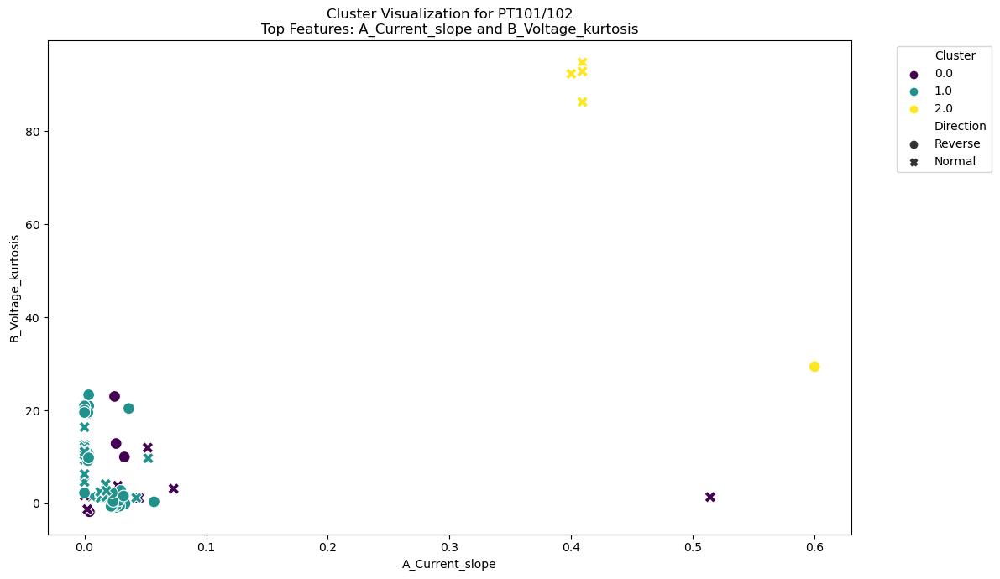


Cluster characteristics for PT101/102:

Cluster 0.0 (n=11):
Direction distribution:
Direction
Normal     7
Reverse    4
Name: count, dtype: int64

Mean values of top 5 features:
B_Voltage_kurtosis    6.006695
A_Current_slope       0.072841
dtype: float64

Cluster 1.0 (n=81):
Direction distribution:
Direction
Reverse    42
Normal     39
Name: count, dtype: int64

Mean values of top 5 features:
B_Voltage_kurtosis    7.505743
A_Current_slope       0.012967
dtype: float64

Cluster 2.0 (n=5):
Direction distribution:
Direction
Normal     4
Reverse    1
Name: count, dtype: int64

Mean values of top 5 features:
B_Voltage_kurtosis    79.090975
A_Current_slope        0.445455
dtype: float64


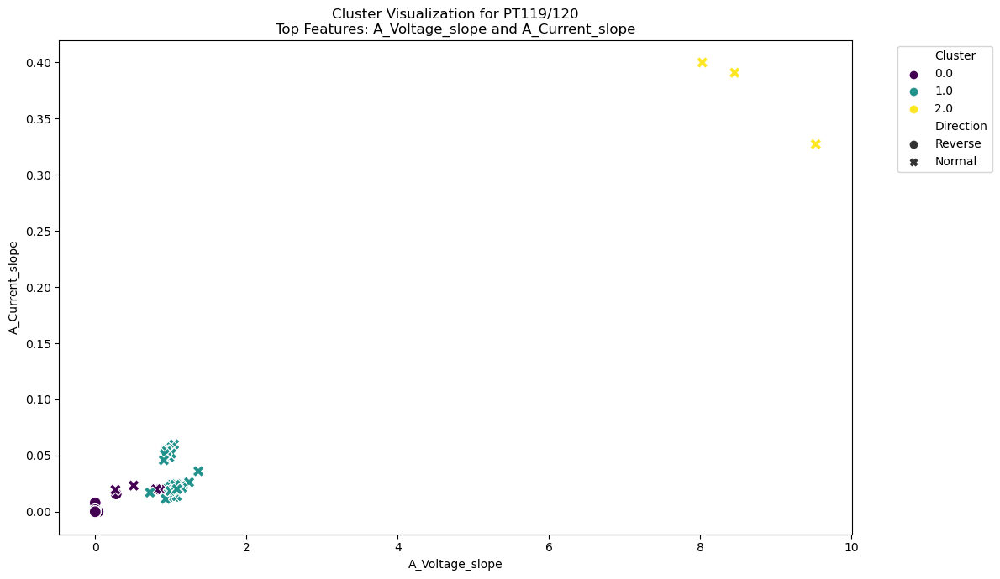


Cluster characteristics for PT119/120:

Cluster 0.0 (n=57):
Direction distribution:
Direction
Reverse    51
Normal      6
Name: count, dtype: int64

Mean values of top 5 features:
A_Voltage_slope    0.085595
A_Current_slope    0.002656
dtype: float64

Cluster 1.0 (n=38):
Direction distribution:
Direction
Normal     37
Reverse     1
Name: count, dtype: int64

Mean values of top 5 features:
A_Voltage_slope    1.002041
A_Current_slope    0.030467
dtype: float64

Cluster 2.0 (n=3):
Direction distribution:
Direction
Normal    3
Name: count, dtype: int64

Mean values of top 5 features:
A_Voltage_slope    8.669697
A_Current_slope    0.372727
dtype: float64


In [25]:
def plot_cluster_results(clustered_df, machine_name):
    if machine_name not in cluster_results:
        print(f"No clustering results available for {machine_name}")
        return
        
    machine_data = clustered_df[clustered_df['Point Machine Name'] == machine_name].dropna()
    if len(machine_data) == 0:
        print(f"No data available for {machine_name}")
        return
    
    # Get top 2 features from clustering
    top_features = cluster_results[machine_name]['feature_importance']['feature'][:2].values
    
    if len(top_features) < 2:
        print(f"Not enough features for {machine_name}")
        return
    
    plt.figure(figsize=(12, 7))
    sns.scatterplot(
        data=machine_data,
        x=top_features[0],
        y=top_features[1],
        hue='Cluster',
        palette='viridis',
        style='Direction',
        s=100
    )
    plt.title(f'Cluster Visualization for {machine_name}\nTop Features: {top_features[0]} and {top_features[1]}')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    # Print cluster characteristics
    print(f"\nCluster characteristics for {machine_name}:")
    for cluster in sorted(machine_data['Cluster'].unique()):
        cluster_data = machine_data[machine_data['Cluster'] == cluster]
        print(f"\nCluster {cluster} (n={len(cluster_data)}):")
        print(f"Direction distribution:")
        print(cluster_data['Direction'].value_counts())
        print("\nMean values of top 5 features:")
        print(cluster_data[top_features[:5]].mean().sort_values(ascending=False))

# Visualize for each clustered machine
for machine in cluster_results.keys():
    plot_cluster_results(clustered_df, machine)

In [32]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec

def plot_current_profiles(clustered_df, original_df):
    # Get list of machines that have clustering results
    machines_with_clusters = clustered_df['Point Machine Name'].unique()
    
    for machine in machines_with_clusters:
        machine_clusters = clustered_df[clustered_df['Point Machine Name'] == machine]
        
        # Skip if no clusters found
        if 'Cluster' not in machine_clusters.columns:
            continue
            
        # Get sorted unique clusters and their count
        unique_clusters = sorted(machine_clusters['Cluster'].unique())
        n_clusters = len(unique_clusters)
        
        # Create figure with subplots for each cluster
        fig = plt.figure(figsize=(15, 5 * n_clusters))
        fig.suptitle(f'Current Profiles for {machine}', y=1.02, fontsize=14)
        gs = GridSpec(n_clusters, 2, figure=fig)
        
        for i, cluster_num in enumerate(unique_clusters):
            # Get original time series data for this cluster
            cluster_indices = machine_clusters[machine_clusters['Cluster'] == cluster_num].index
            cluster_data = original_df.loc[cluster_indices]
            
            # Create subplots for this cluster
            ax1 = fig.add_subplot(gs[i, 0])
            ax2 = fig.add_subplot(gs[i, 1])
            
            # Plot A Currents
            max_length = 0
            a_currents = []
            for idx, row in cluster_data.iterrows():
                try:
                    current = row['A Current']
                    if isinstance(current, str):
                        current = eval(current)
                    if isinstance(current, (list, np.ndarray)):
                        ax1.plot(current, alpha=0.4, color='blue')
                        a_currents.append(current)
                        max_length = max(max_length, len(current))
                except Exception as e:
                    continue
                    
            # Plot interpolated mean A current
            if a_currents:
                # Create interpolated arrays of same length
                interpolated = []
                for current in a_currents:
                    x_old = np.linspace(0, 1, len(current))
                    x_new = np.linspace(0, 1, max_length)
                    interpolated.append(np.interp(x_new, x_old, current))
                
                mean_a = np.nanmean(interpolated, axis=0)
                ax1.plot(mean_a, color='black', linewidth=2, label='Mean')
                ax1.legend()
            
            ax1.set_title(f'Cluster {cluster_num} - A Current (n={len(cluster_data)})')
            ax1.set_xlabel('Time Steps (normalized)')
            ax1.set_ylabel('Current (A)')
            ax1.grid(True)
            
            # Plot B Currents
            max_length = 0
            b_currents = []
            for idx, row in cluster_data.iterrows():
                try:
                    current = row['B Current']
                    if isinstance(current, str):
                        current = eval(current)
                    if isinstance(current, (list, np.ndarray)):
                        ax2.plot(current, alpha=0.4, color='green')
                        b_currents.append(current)
                        max_length = max(max_length, len(current))
                except Exception as e:
                    continue
            
            # Plot interpolated mean B current
            if b_currents:
                # Create interpolated arrays of same length
                interpolated = []
                for current in b_currents:
                    x_old = np.linspace(0, 1, len(current))
                    x_new = np.linspace(0, 1, max_length)
                    interpolated.append(np.interp(x_new, x_old, current))
                
                mean_b = np.nanmean(interpolated, axis=0)
                ax2.plot(mean_b, color='black', linewidth=2, label='Mean')
                ax2.legend()
            
            ax2.set_title(f'Cluster {cluster_num} - B Current (n={len(cluster_data)})')
            ax2.set_xlabel('Time Steps (normalized)')
            ax2.set_ylabel('Current (A)')
            ax2.grid(True)
        
        plt.tight_layout()
        plt.show()
        
        # Print cluster statistics
        print(f"\nStatistics for {machine}:")
        for cluster_num in unique_clusters:
            cluster_size = len(machine_clusters[machine_clusters['Cluster'] == cluster_num])
            directions = machine_clusters[machine_clusters['Cluster'] == cluster_num]['Direction'].value_counts()
            print(f"\nCluster {cluster_num} (Size: {cluster_size}):")
            print(f"Directions: {directions.to_dict()}")
            print("Mean features:")
            print(machine_clusters[machine_clusters['Cluster'] == cluster_num].select_dtypes(include=[np.number]).mean().sort_values(ascending=False)[:5])



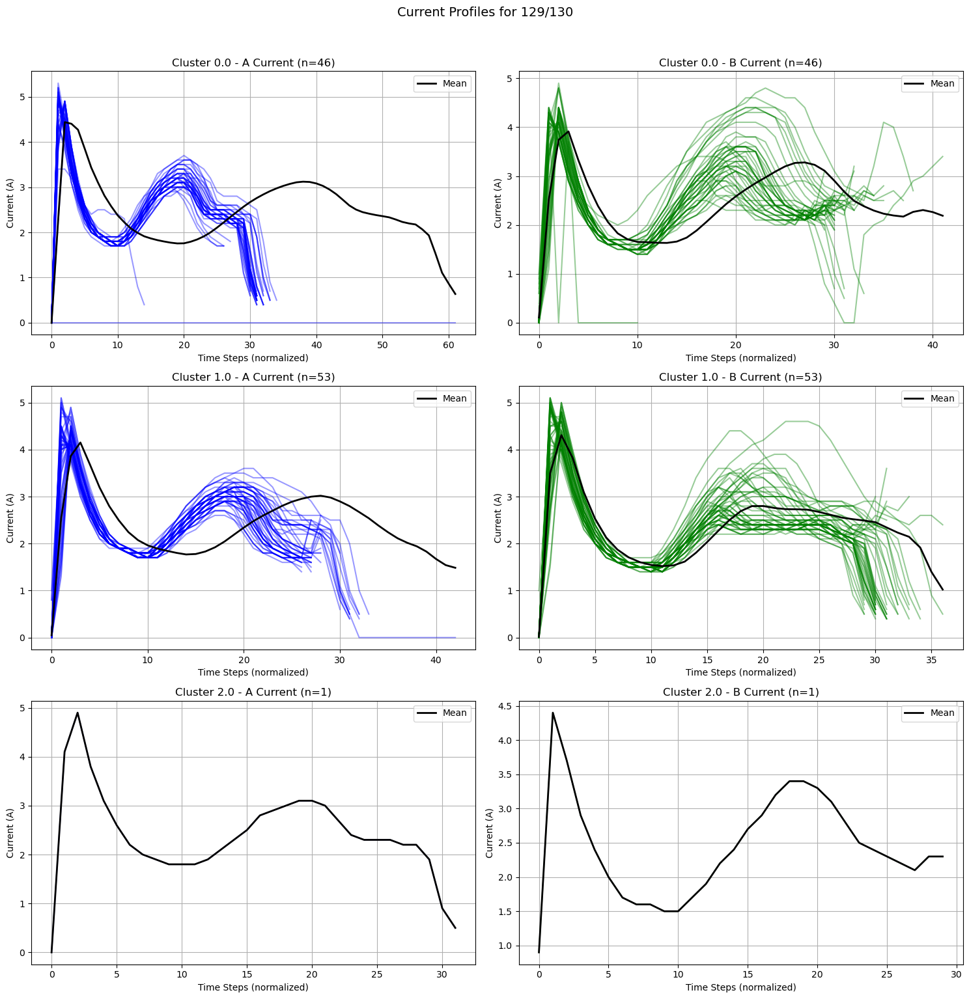


Statistics for 129/130:

Cluster 0.0 (Size: 46):
Directions: {'Normal': 46}
Mean features:
B_Voltage_energy    560189.347826
A_Voltage_energy    288563.918478
B_Current_energy       188.122609
A_Current_energy       171.954565
B_Voltage_max          120.163043
dtype: float64

Cluster 1.0 (Size: 53):
Directions: {'Reverse': 53}
Mean features:
A_Voltage_energy    414342.849057
B_Voltage_energy    308286.169811
B_Current_energy       222.931132
A_Current_energy       220.616415
A_Voltage_max          116.433962
dtype: float64

Cluster 2.0 (Size: 1):
Directions: {'Reverse': 1}
Mean features:
A_Voltage_energy    780259.50
B_Voltage_energy     93206.25
A_Voltage_max          121.50
A_Voltage_range        121.50
B_Voltage_range        111.00
dtype: float64


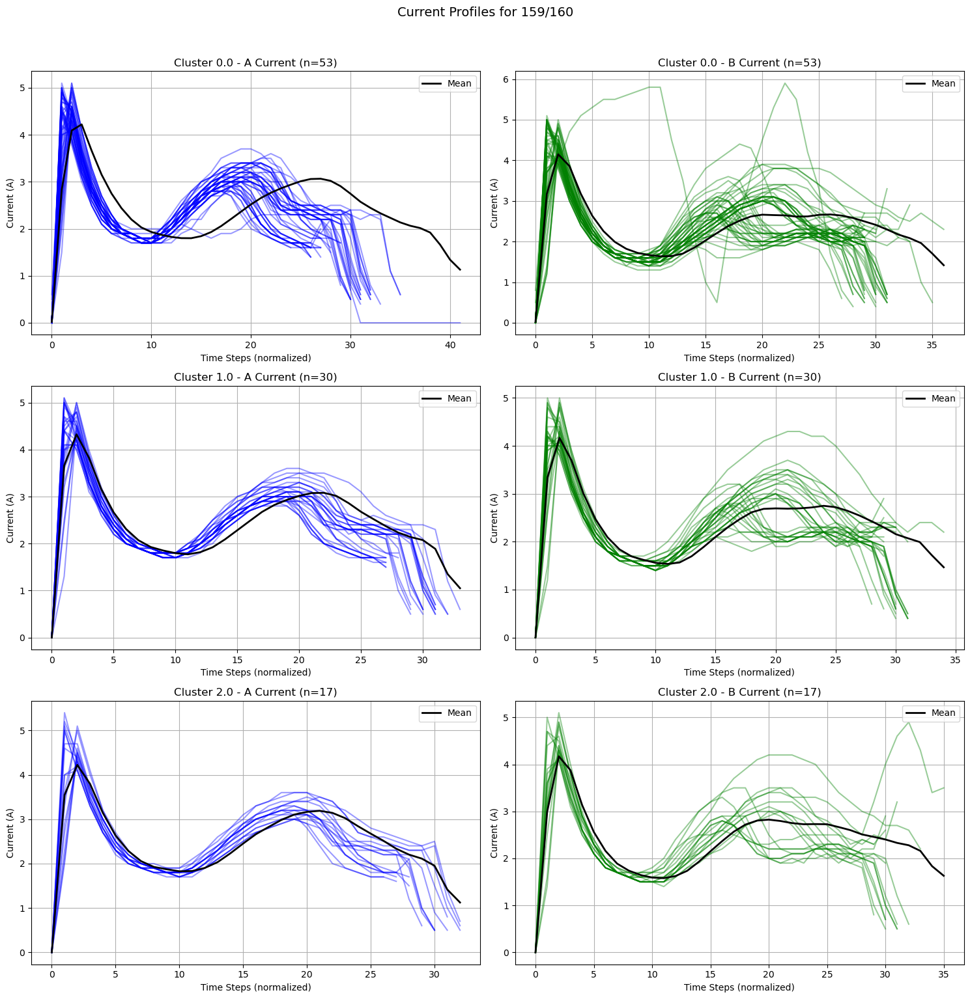


Statistics for 159/160:

Cluster 0.0 (Size: 53):
Directions: {'Normal': 50, 'Reverse': 3}
Mean features:
A_Voltage_energy    699536.334906
B_Voltage_energy    325970.108491
A_Voltage_max          128.886792
A_Voltage_range        128.886792
B_Voltage_max          117.424528
dtype: float64

Cluster 1.0 (Size: 30):
Directions: {'Reverse': 29, 'Normal': 1}
Mean features:
B_Voltage_energy    796803.300000
A_Voltage_energy    375848.700000
A_Current_energy       132.398333
B_Voltage_max          132.000000
B_Voltage_range        132.000000
dtype: float64

Cluster 2.0 (Size: 17):
Directions: {'Reverse': 17}
Mean features:
B_Voltage_energy    968517.794118
A_Voltage_energy    141520.235294
B_Voltage_range        127.411765
B_Voltage_max          127.411765
A_Voltage_max          116.294118
dtype: float64


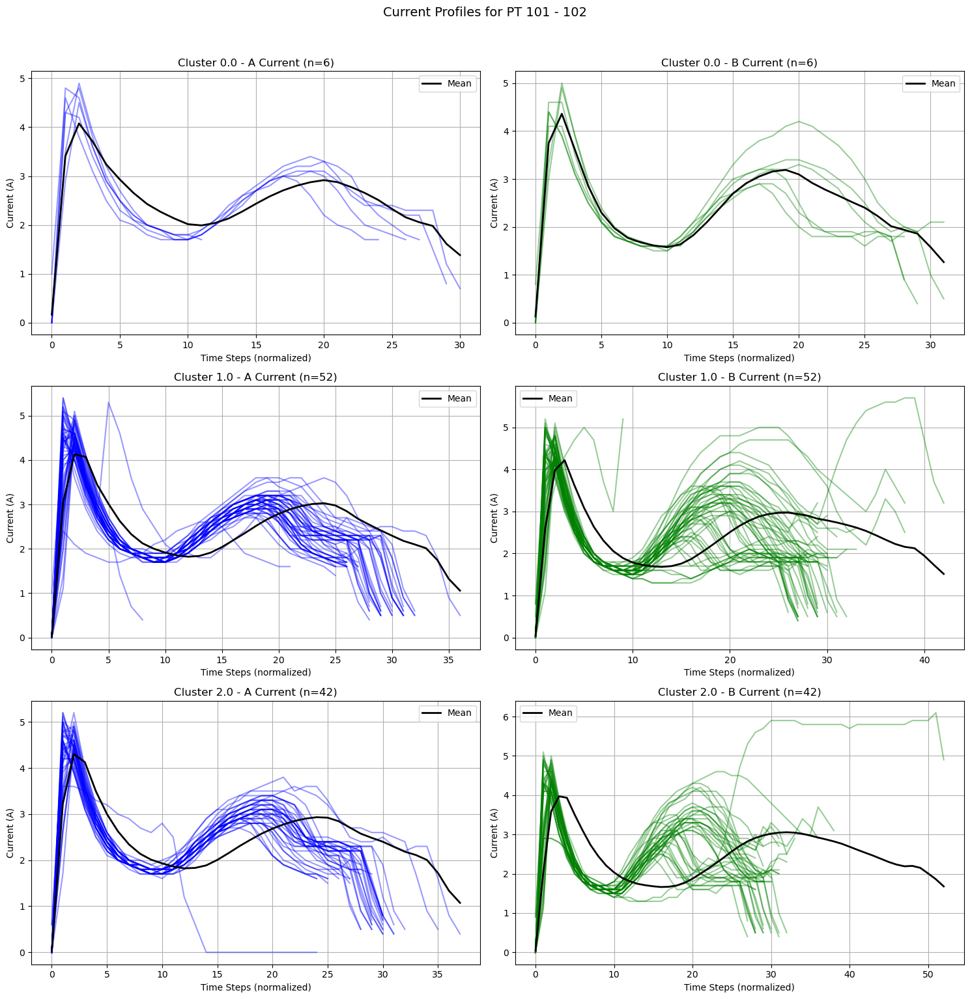


Statistics for PT 101 - 102:

Cluster 0.0 (Size: 6):
Directions: {'Normal': 4, 'Reverse': 2}
Mean features:
A_Voltage_energy    545171.625000
B_Voltage_energy    264645.750000
A_Current_energy      2475.470000
B_Current_energy       529.118333
B_Voltage_range        103.250000
dtype: float64

Cluster 1.0 (Size: 52):
Directions: {'Normal': 42, 'Reverse': 10}
Mean features:
A_Voltage_energy    509459.365385
B_Voltage_energy    294682.716346
B_Current_energy       414.716346
A_Current_energy       368.730962
A_Voltage_max          118.759615
dtype: float64

Cluster 2.0 (Size: 42):
Directions: {'Reverse': 40, 'Normal': 2}
Mean features:
B_Voltage_energy    542531.785714
A_Voltage_energy    347632.607143
B_Current_energy       717.517857
A_Current_energy       362.647619
B_Voltage_max          117.357143
dtype: float64


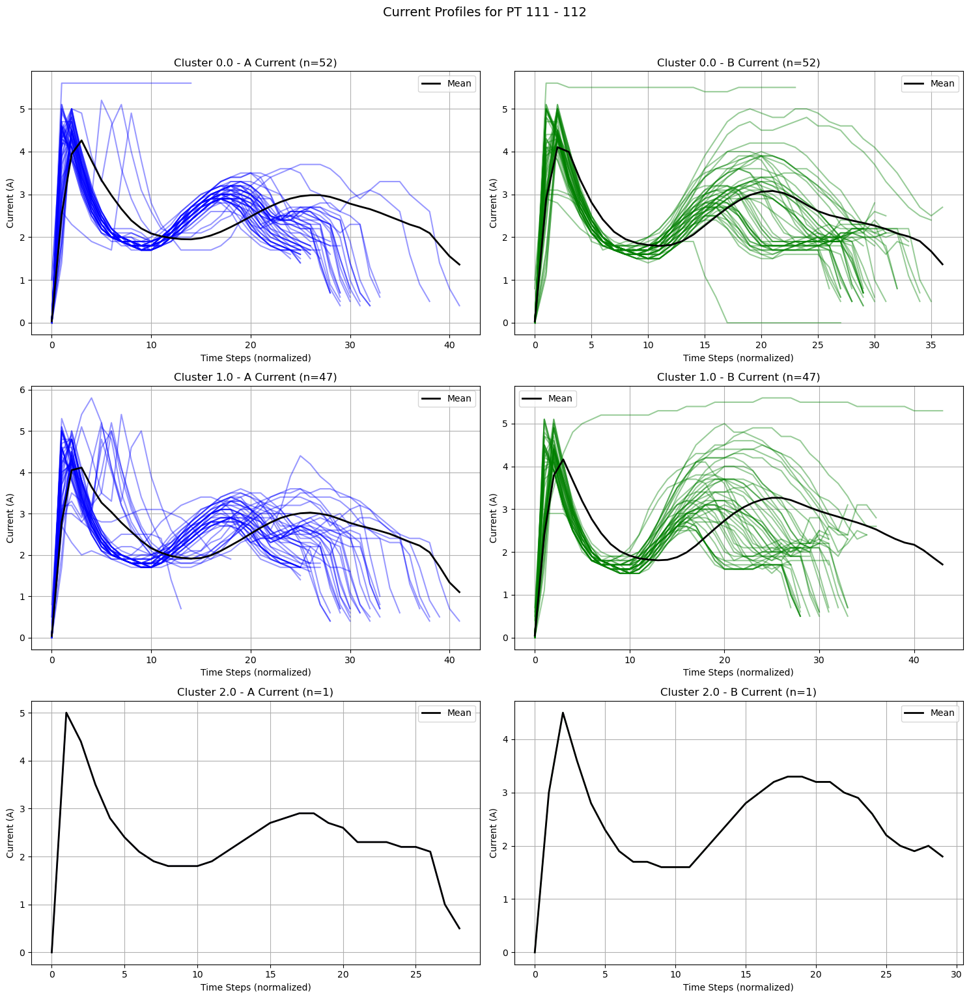


Statistics for PT 111 - 112:

Cluster 0.0 (Size: 52):
Directions: {'Reverse': 49, 'Normal': 3}
Mean features:
A_Voltage_energy    547512.144231
B_Voltage_energy    329742.865385
B_Current_energy       233.078654
A_Current_energy       222.731346
A_Voltage_max          120.403846
dtype: float64

Cluster 1.0 (Size: 47):
Directions: {'Normal': 47}
Mean features:
B_Voltage_energy    611064.622340
A_Voltage_energy    329312.632979
B_Current_energy       256.084468
A_Current_energy       197.885957
B_Voltage_max          121.500000
dtype: float64

Cluster 2.0 (Size: 1):
Directions: {'Reverse': 1}
Mean features:
A_Voltage_energy    202333.50
B_Voltage_energy     88177.50
B_Current_energy       257.93
A_Voltage_max          111.00
A_Voltage_range        111.00
dtype: float64


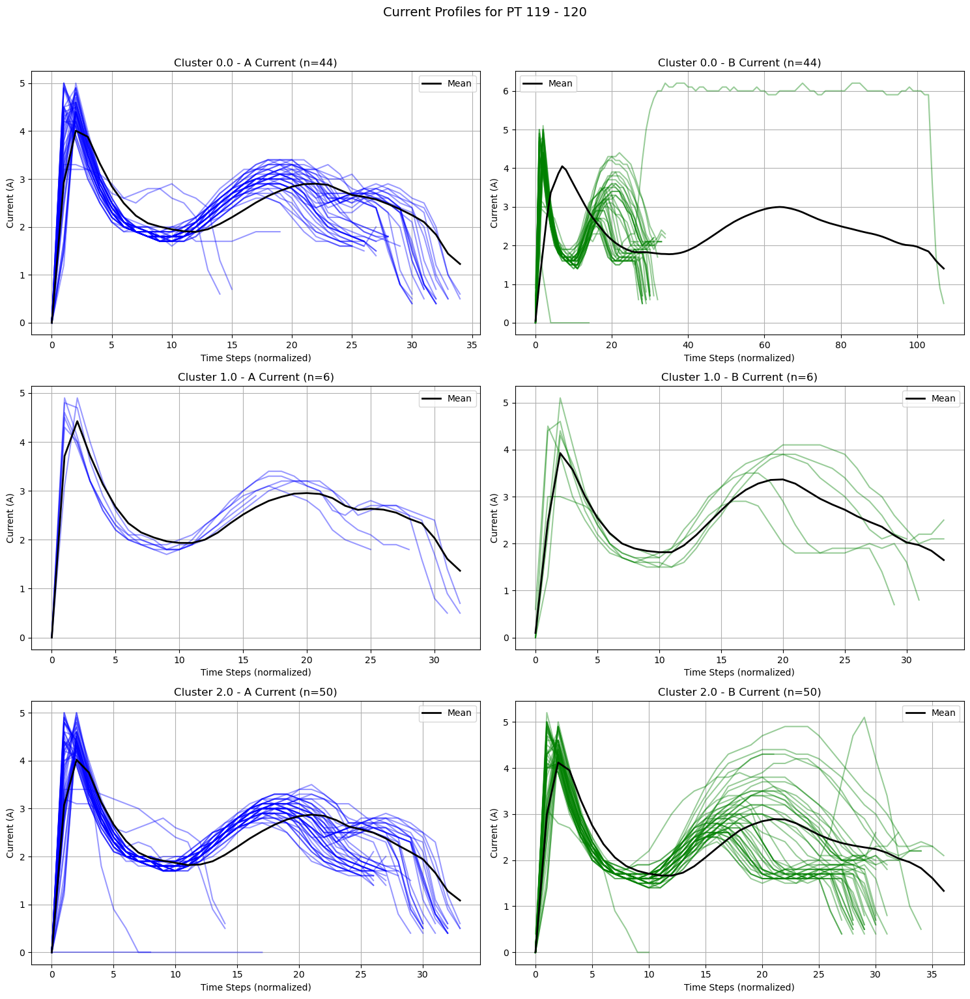


Statistics for PT 119 - 120:

Cluster 0.0 (Size: 44):
Directions: {'Reverse': 40, 'Normal': 4}
Mean features:
B_Voltage_energy    538884.511364
A_Voltage_energy    338025.323864
B_Current_energy       250.600455
A_Current_energy       249.991136
B_Voltage_range        116.965909
dtype: float64

Cluster 1.0 (Size: 6):
Directions: {'Normal': 4, 'Reverse': 2}
Mean features:
A_Voltage_energy    640286.250
B_Voltage_energy    289393.125
A_Current_energy      2499.770
B_Current_energy      1312.530
A_Voltage_range        111.250
dtype: float64

Cluster 2.0 (Size: 50):
Directions: {'Normal': 46, 'Reverse': 4}
Mean features:
A_Voltage_energy    595207.4850
B_Voltage_energy    313744.9500
A_Current_energy       351.3674
B_Current_energy       218.0338
A_Voltage_max          119.1600
dtype: float64


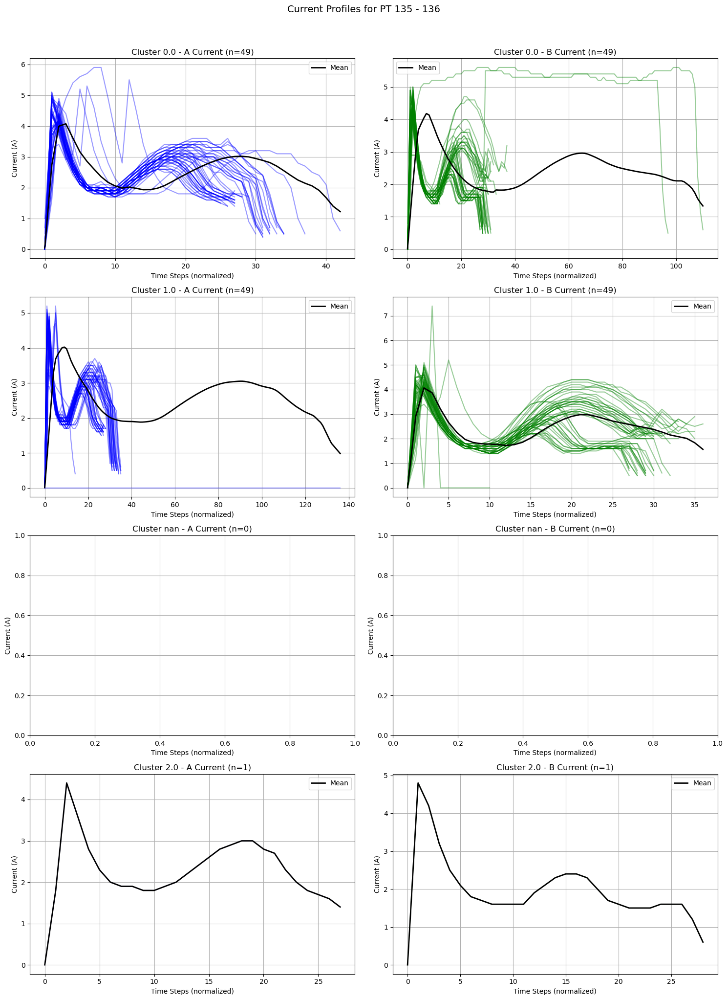


Statistics for PT 135 - 136:

Cluster 0.0 (Size: 49):
Directions: {'Normal': 47, 'Reverse': 2}
Mean features:
A_Voltage_energy    558156.581633
B_Voltage_energy    293412.397959
A_Current_energy       188.063265
B_Current_energy       166.943061
A_Voltage_range        123.857143
dtype: float64

Cluster 1.0 (Size: 49):
Directions: {'Reverse': 48, 'Normal': 1}
Mean features:
B_Voltage_energy    529788.581633
A_Voltage_energy    332766.321429
B_Current_energy       268.466735
A_Current_energy       194.918367
B_Voltage_max          120.948980
dtype: float64

Cluster nan (Size: 0):
Directions: {}
Mean features:
A_Current_mean    NaN
A_Current_std     NaN
A_Current_max     NaN
A_Current_min     NaN
A_Current_range   NaN
dtype: float64

Cluster 2.0 (Size: 1):
Directions: {'Normal': 1}
Mean features:
B_Voltage_energy    284294.25
A_Voltage_energy     71790.75
A_Current_energy       805.20
B_Current_energy       302.75
B_Voltage_max          109.50
dtype: float64


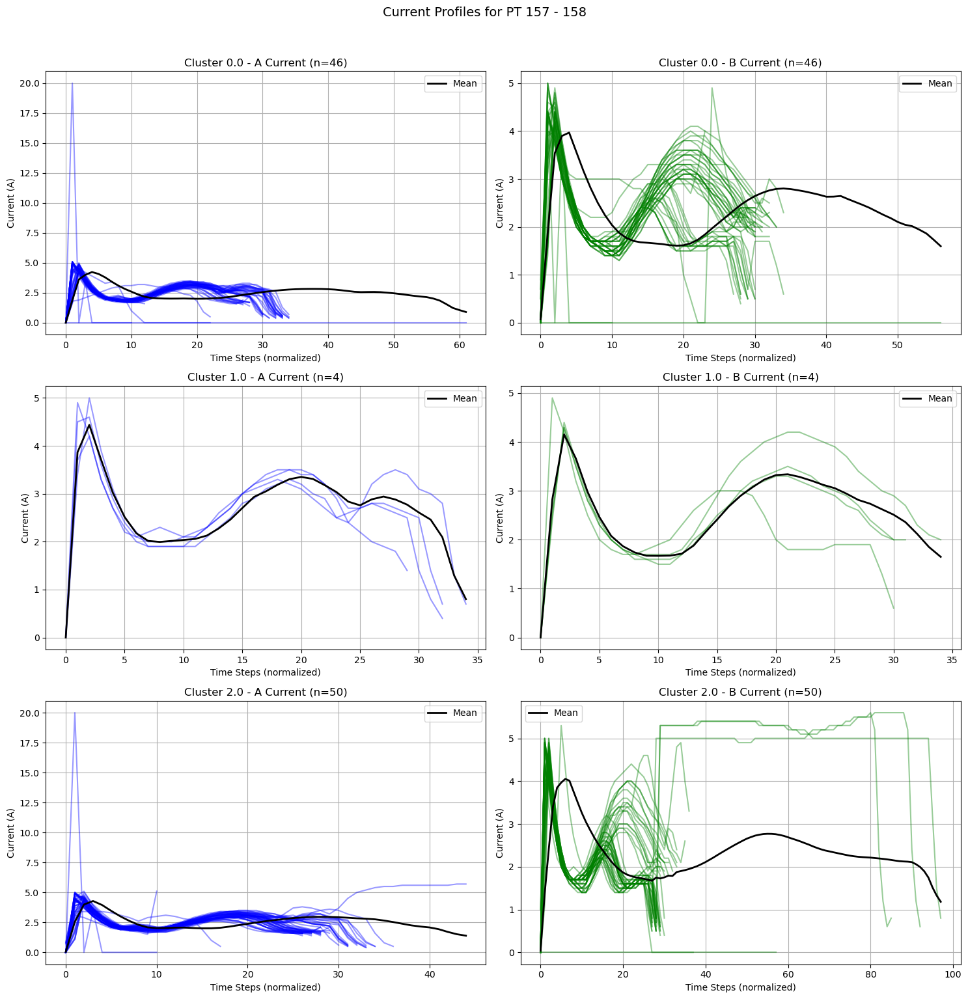


Statistics for PT 157 - 158:

Cluster 0.0 (Size: 46):
Directions: {'Normal': 46}
Mean features:
A_Voltage_energy    555755.722826
B_Voltage_energy    310007.788043
A_Current_energy       261.643913
B_Current_energy       178.655435
A_Voltage_max          122.347826
dtype: float64

Cluster 1.0 (Size: 4):
Directions: {'Normal': 4}
Mean features:
A_Voltage_energy    556232.0625
B_Voltage_energy    328647.3750
A_Current_energy      2277.3950
B_Current_energy       243.2750
B_Voltage_range        113.6250
dtype: float64

Cluster 2.0 (Size: 50):
Directions: {'Reverse': 50}
Mean features:
B_Voltage_energy    547325.8200
A_Voltage_energy    378177.3450
A_Current_energy       365.9536
B_Current_energy       337.2308
B_Voltage_max          120.8400
dtype: float64


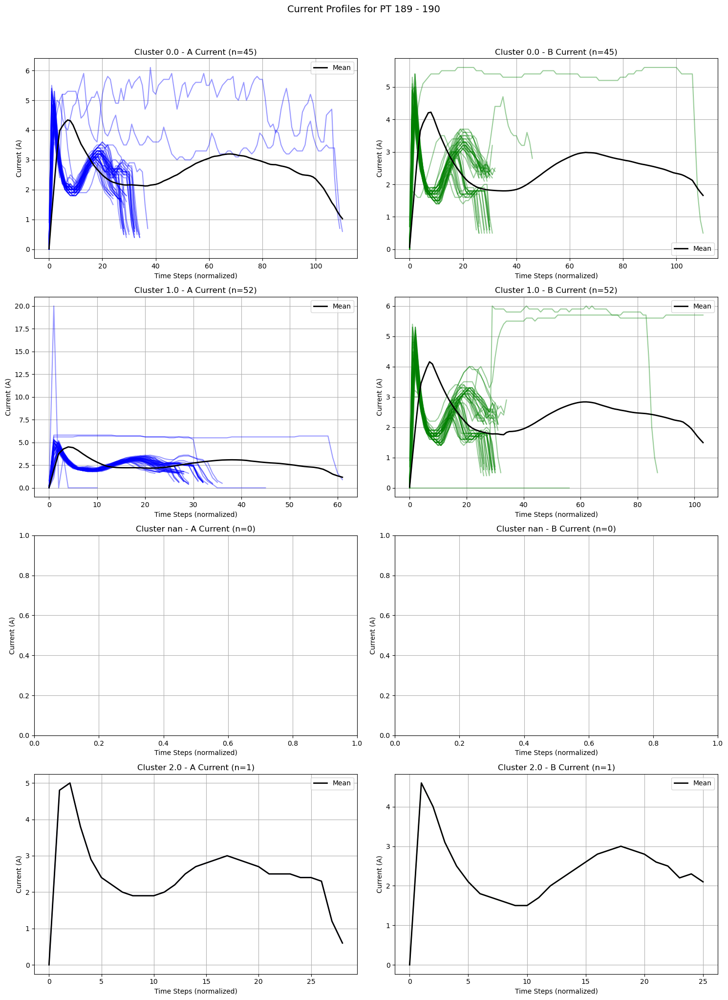


Statistics for PT 189 - 190:

Cluster 0.0 (Size: 45):
Directions: {'Normal': 44, 'Reverse': 1}
Mean features:
B_Voltage_energy    587501.050000
A_Voltage_energy    284003.800000
B_Current_energy       175.876000
A_Current_energy       160.333111
B_Voltage_max          122.166667
dtype: float64

Cluster 1.0 (Size: 52):
Directions: {'Reverse': 51, 'Normal': 1}
Mean features:
A_Voltage_energy    553409.091346
B_Voltage_energy    332525.466346
A_Current_energy       294.505577
B_Current_energy       244.396923
A_Voltage_max          119.336538
dtype: float64

Cluster nan (Size: 0):
Directions: {}
Mean features:
A_Current_mean    NaN
A_Current_std     NaN
A_Current_max     NaN
A_Current_min     NaN
A_Current_range   NaN
dtype: float64

Cluster 2.0 (Size: 1):
Directions: {'Reverse': 1}
Mean features:
A_Voltage_energy    299700.00
B_Voltage_energy     45056.25
B_Current_energy       739.23
A_Current_energy       701.51
B_Voltage_max           90.00
dtype: float64


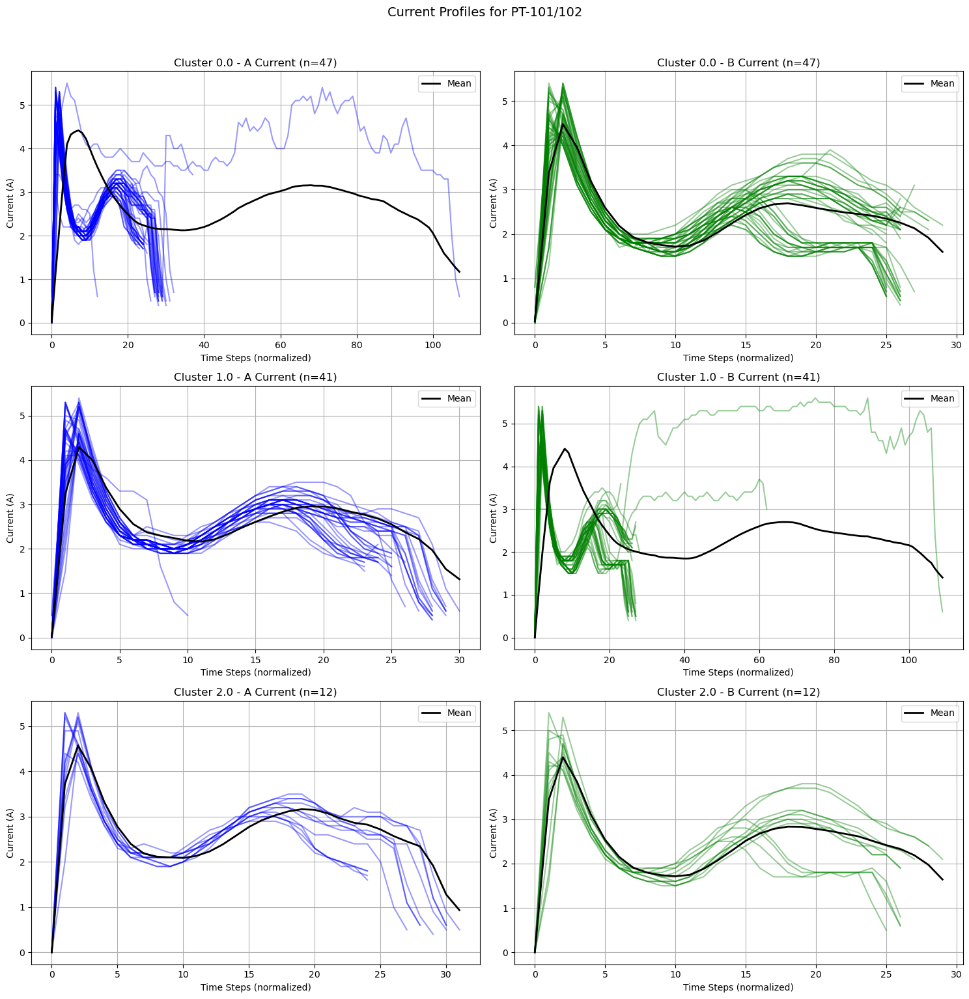


Statistics for PT-101/102:

Cluster 0.0 (Size: 47):
Directions: {'Normal': 31, 'Reverse': 16}
Mean features:
A_Voltage_energy    1.914746e+06
B_Voltage_energy    1.699657e+06
B_Current_energy    1.210293e+03
A_Current_energy    1.137953e+03
A_Voltage_range     1.135894e+02
dtype: float64

Cluster 1.0 (Size: 41):
Directions: {'Normal': 40, 'Reverse': 1}
Mean features:
B_Voltage_energy    542108.614634
A_Voltage_energy    365695.488049
B_Current_energy       228.408049
A_Current_energy       152.792927
B_Voltage_range        121.912195
dtype: float64

Cluster 2.0 (Size: 12):
Directions: {'Reverse': 9, 'Normal': 3}
Mean features:
B_Voltage_energy    1.865400e+06
A_Voltage_energy    1.093910e+06
B_Current_energy    3.891868e+03
A_Current_energy    3.872294e+03
B_Voltage_range     9.860833e+01
dtype: float64


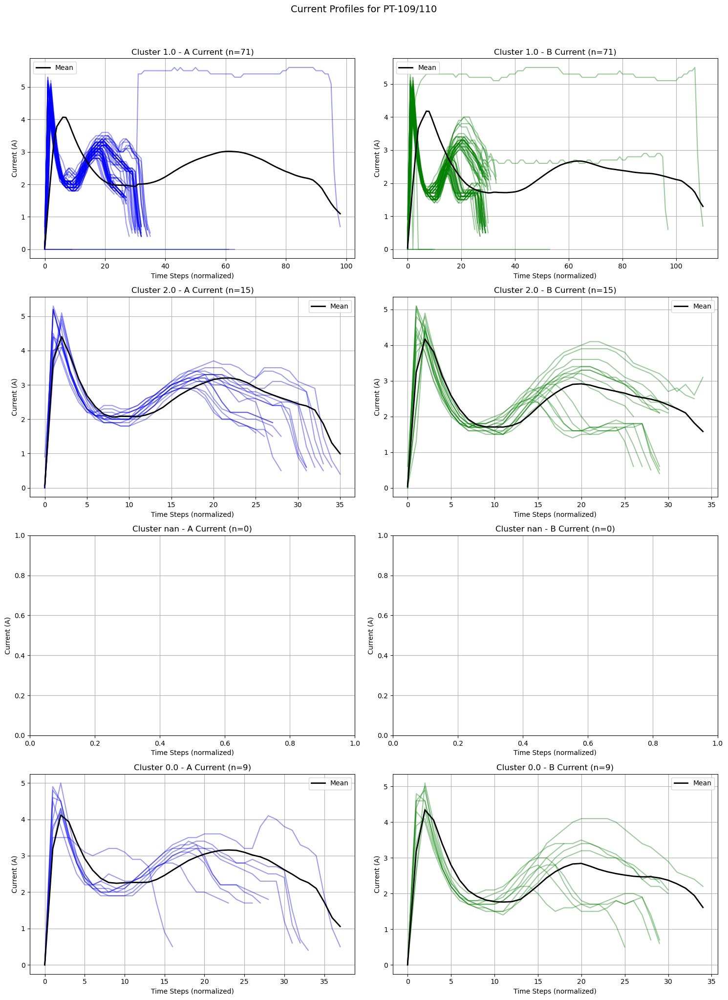


Statistics for PT-109/110:

Cluster 1.0 (Size: 71):
Directions: {'Reverse': 36, 'Normal': 35}
Mean features:
B_Voltage_energy    1.621533e+06
A_Voltage_energy    1.548984e+06
A_Current_energy    1.684550e+03
B_Current_energy    1.549803e+03
B_Voltage_max       9.348028e+01
dtype: float64

Cluster 2.0 (Size: 15):
Directions: {'Reverse': 14, 'Normal': 1}
Mean features:
A_Voltage_energy    1.945219e+06
B_Voltage_energy    1.840596e+06
A_Current_energy    7.362313e+03
B_Current_energy    4.288589e+03
B_Voltage_range     9.256000e+01
dtype: float64

Cluster nan (Size: 0):
Directions: {}
Mean features:
A_Current_mean    NaN
A_Current_std     NaN
A_Current_max     NaN
A_Current_min     NaN
A_Current_range   NaN
dtype: float64

Cluster 0.0 (Size: 9):
Directions: {'Normal': 9}
Mean features:
B_Voltage_energy    1.752996e+06
A_Voltage_energy    1.740959e+06
B_Current_energy    6.331748e+03
A_Current_energy    4.310374e+03
A_Voltage_max       9.375556e+01
dtype: float64


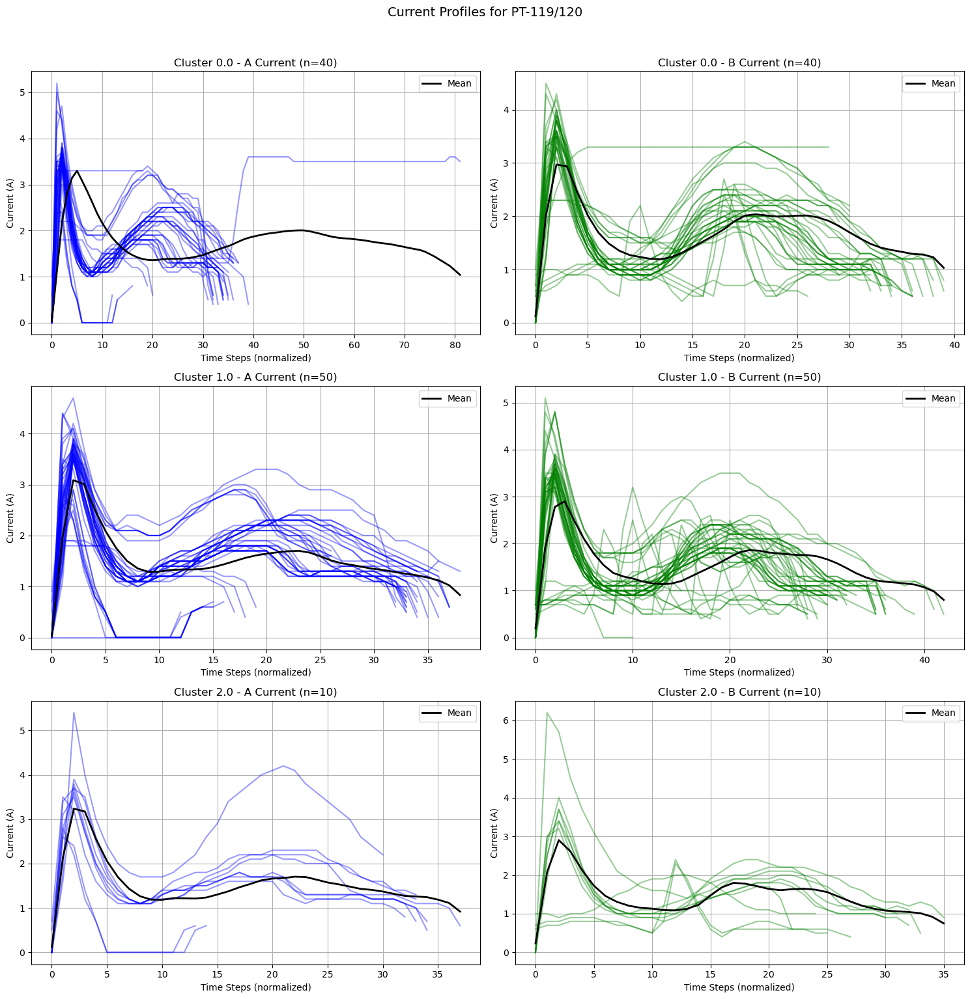


Statistics for PT-119/120:

Cluster 0.0 (Size: 40):
Directions: {'Normal': 40}
Mean features:
B_Voltage_energy    422110.4625
A_Voltage_energy    337545.4500
A_Current_energy       235.6525
B_Current_energy       158.4835
B_Voltage_max          122.4750
dtype: float64

Cluster 1.0 (Size: 50):
Directions: {'Reverse': 41, 'Normal': 9}
Mean features:
A_Voltage_energy    445176.8550
B_Voltage_energy    347181.4350
A_Current_energy       331.1110
B_Current_energy       238.2332
A_Voltage_max          119.8500
dtype: float64

Cluster 2.0 (Size: 10):
Directions: {'Reverse': 10}
Mean features:
B_Voltage_energy    536444.325
A_Voltage_energy    461946.600
B_Current_energy       281.708
A_Current_energy       218.468
B_Voltage_max          116.700
dtype: float64


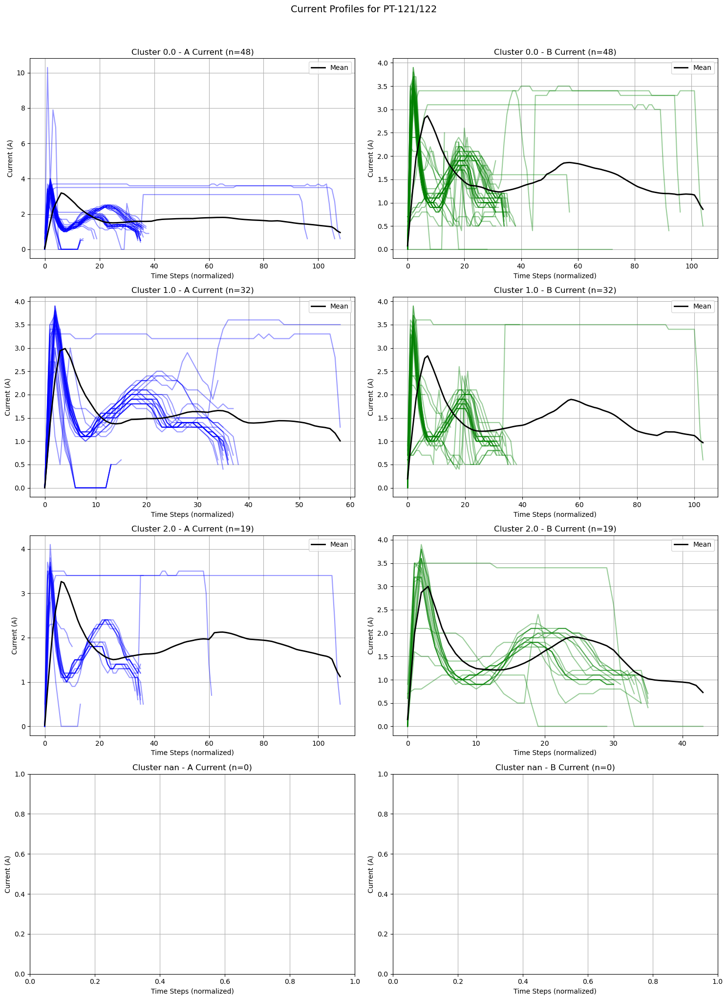


Statistics for PT-121/122:

Cluster 0.0 (Size: 48):
Directions: {'Normal': 48}
Mean features:
A_Voltage_energy    1.053178e+06
B_Voltage_energy    3.495076e+05
A_Current_energy    2.273852e+02
B_Current_energy    2.165269e+02
A_Voltage_range     1.588125e+02
dtype: float64

Cluster 1.0 (Size: 32):
Directions: {'Reverse': 32}
Mean features:
B_Voltage_energy    1.049784e+06
A_Voltage_energy    4.165727e+05
A_Current_energy    3.131772e+02
B_Current_energy    3.101834e+02
B_Voltage_max       1.628906e+02
dtype: float64

Cluster 2.0 (Size: 19):
Directions: {'Reverse': 17, 'Normal': 2}
Mean features:
A_Voltage_energy    443246.328947
B_Voltage_energy    322183.184211
B_Current_energy       658.190526
A_Current_energy       457.491579
A_Voltage_max          147.078947
dtype: float64

Cluster nan (Size: 0):
Directions: {}
Mean features:
A_Current_mean    NaN
A_Current_std     NaN
A_Current_max     NaN
A_Current_min     NaN
A_Current_range   NaN
dtype: float64


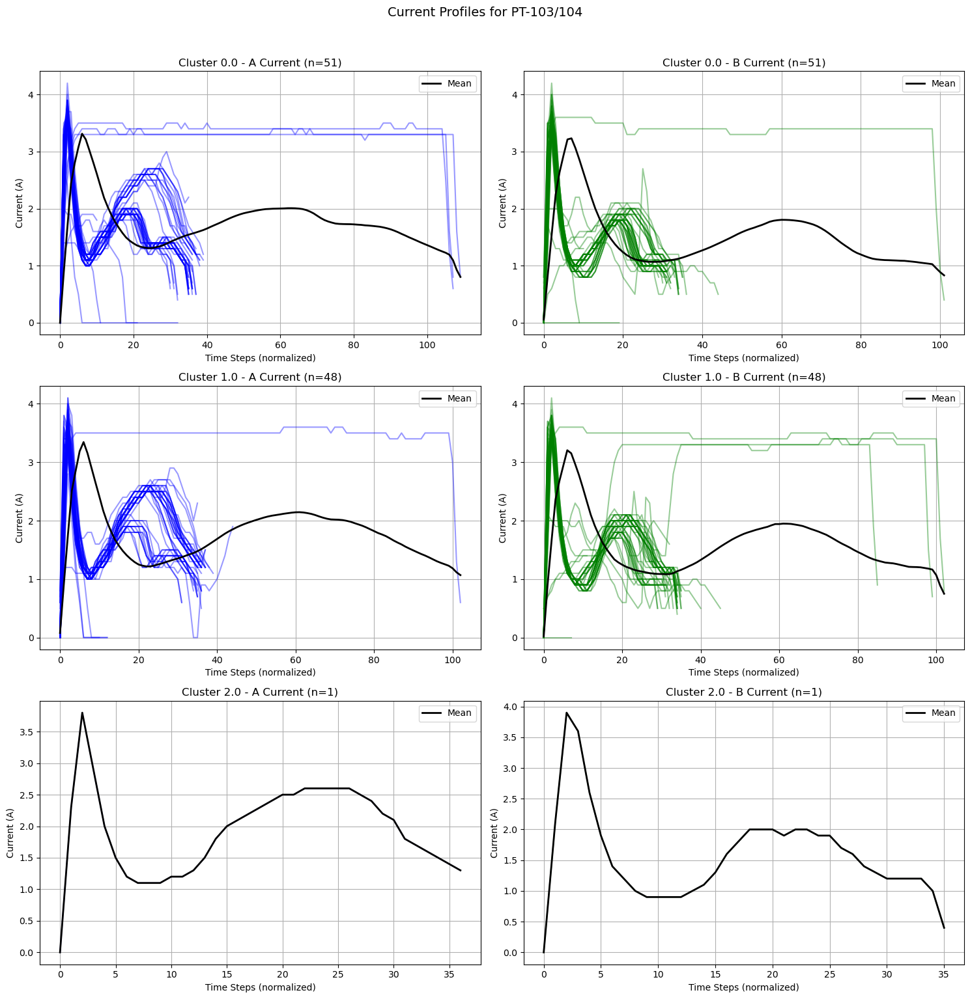


Statistics for PT-103/104:

Cluster 0.0 (Size: 51):
Directions: {'Reverse': 51}
Mean features:
B_Voltage_energy    384860.867647
A_Voltage_energy    322097.073529
B_Current_energy       291.543333
A_Current_energy       241.691961
B_Voltage_max          116.970588
dtype: float64

Cluster 1.0 (Size: 48):
Directions: {'Normal': 48}
Mean features:
A_Voltage_energy    385146.890625
B_Voltage_energy    334662.843750
B_Current_energy       205.688542
A_Current_energy       173.788958
A_Voltage_max          119.375000
dtype: float64

Cluster 2.0 (Size: 1):
Directions: {'Normal': 1}
Mean features:
A_Voltage_energy    1356707.25
B_Voltage_energy     354651.75
A_Current_energy       3504.46
B_Current_energy        247.19
A_Voltage_max           120.00
dtype: float64


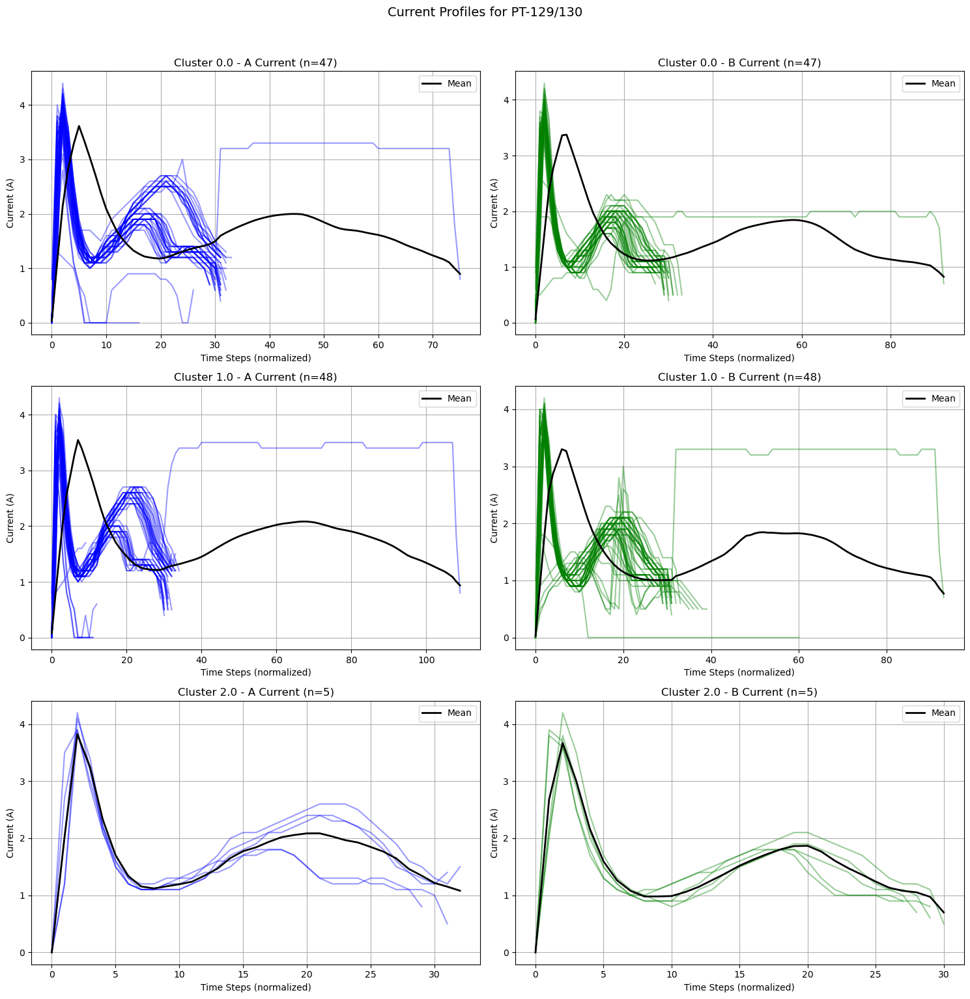


Statistics for PT-129/130:

Cluster 0.0 (Size: 47):
Directions: {'Normal': 47}
Mean features:
B_Voltage_energy    2.877917e+06
A_Voltage_energy    1.621249e+06
B_Current_energy    1.084694e+03
A_Current_energy    7.693602e+02
B_Voltage_max       1.222362e+02
dtype: float64

Cluster 1.0 (Size: 48):
Directions: {'Reverse': 46, 'Normal': 2}
Mean features:
A_Voltage_energy    2.785006e+06
B_Voltage_energy    1.426953e+06
A_Current_energy    3.033696e+02
B_Current_energy    2.083979e+02
A_Voltage_max       1.218271e+02
dtype: float64

Cluster 2.0 (Size: 5):
Directions: {'Normal': 5}
Mean features:
B_Voltage_energy    1728243.754
A_Voltage_energy      46887.412
B_Current_energy        594.642
A_Current_energy        185.240
B_Voltage_max           121.140
dtype: float64


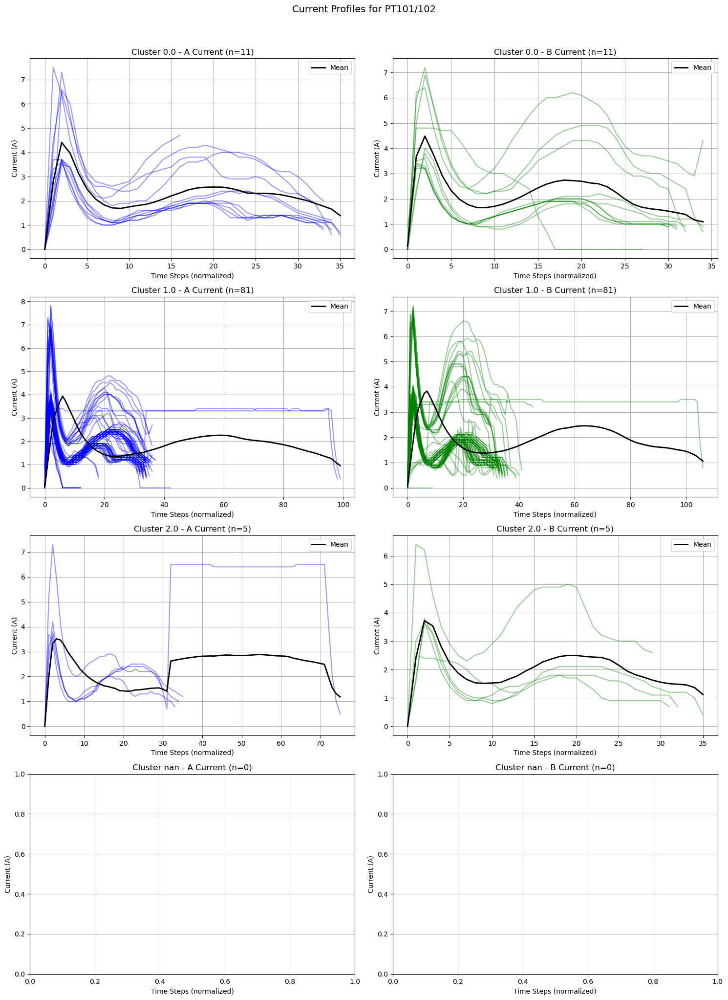


Statistics for PT101/102:

Cluster 0.0 (Size: 11):
Directions: {'Normal': 7, 'Reverse': 4}
Mean features:
A_Voltage_energy    1.538191e+06
B_Voltage_energy    1.226090e+06
A_Current_energy    6.328310e+03
B_Current_energy    5.311235e+03
B_Voltage_max       1.012545e+02
dtype: float64

Cluster 1.0 (Size: 81):
Directions: {'Reverse': 42, 'Normal': 39}
Mean features:
A_Voltage_energy    2.299570e+06
B_Voltage_energy    2.037278e+06
B_Current_energy    1.489210e+03
A_Current_energy    1.447308e+03
B_Voltage_range     1.127506e+02
dtype: float64

Cluster 2.0 (Size: 5):
Directions: {'Normal': 4, 'Reverse': 1}
Mean features:
B_Voltage_energy    1383501.426
A_Voltage_energy      35215.060
B_Current_energy        884.346
A_Current_energy        277.450
B_Voltage_max           115.560
dtype: float64

Cluster nan (Size: 0):
Directions: {}
Mean features:
A_Current_mean    NaN
A_Current_std     NaN
A_Current_max     NaN
A_Current_min     NaN
A_Current_range   NaN
dtype: float64


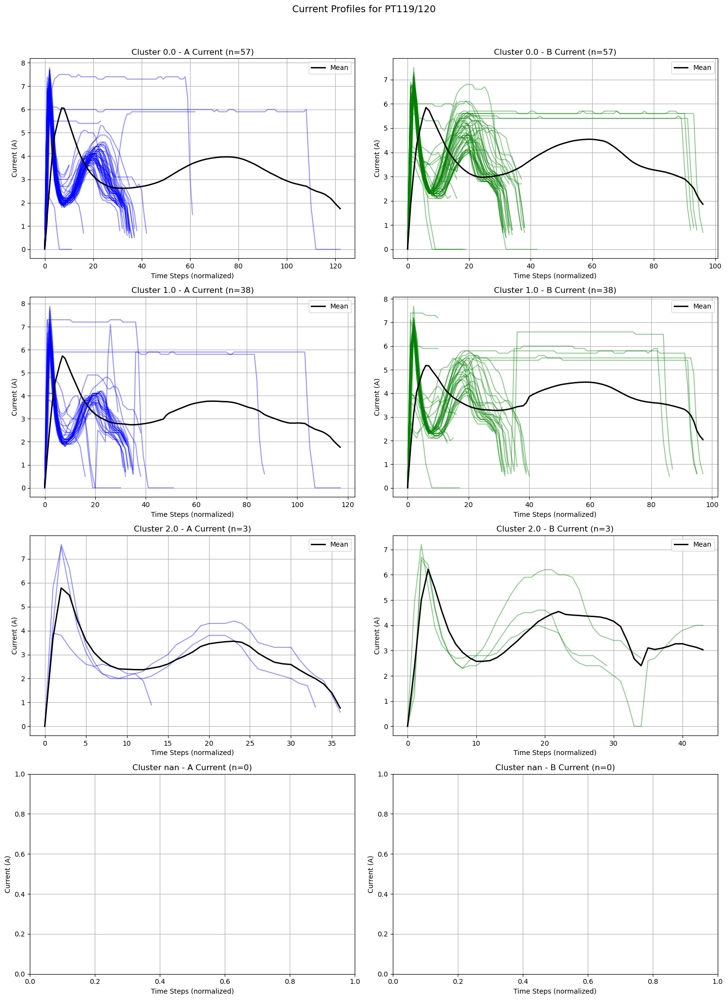


Statistics for PT119/120:

Cluster 0.0 (Size: 57):
Directions: {'Reverse': 51, 'Normal': 6}
Mean features:
A_Voltage_energy    2.944808e+06
B_Voltage_energy    2.033919e+06
B_Current_energy    3.679292e+03
A_Current_energy    2.342591e+03
A_Voltage_max       1.229193e+02
dtype: float64

Cluster 1.0 (Size: 38):
Directions: {'Normal': 37, 'Reverse': 1}
Mean features:
B_Voltage_energy    3.021258e+06
A_Voltage_energy    1.486046e+06
B_Current_energy    8.480303e+02
A_Current_energy    7.904589e+02
B_Voltage_max       1.245868e+02
dtype: float64

Cluster 2.0 (Size: 3):
Directions: {'Normal': 3}
Mean features:
B_Voltage_energy    1.096010e+06
A_Voltage_energy    4.930114e+04
B_Current_energy    3.955733e+02
A_Current_energy    1.926967e+02
B_Voltage_range     1.220000e+02
dtype: float64

Cluster nan (Size: 0):
Directions: {}
Mean features:
A_Current_mean    NaN
A_Current_std     NaN
A_Current_max     NaN
A_Current_min     NaN
A_Current_range   NaN
dtype: float64


In [33]:
# Run the visualization
plot_current_profiles(clustered_df, df)

# Creating image Dataset 

In [37]:
import os
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
import shutil

def create_image_dataset(df, output_dir='point_machine_images'):
    """
    Create an image dataset with original point machine names as labels
    Returns: DataFrame with image paths and original labels
    """
    # Create clean directory structure
    if os.path.exists(output_dir):
        shutil.rmtree(output_dir)
    os.makedirs(output_dir)
    
    # First collect all unique machine names
    all_machines = df['Point Machine Name'].unique()
    
    # Create a mapping to filesystem-safe names while preserving original labels
    safe_names = {}
    for machine in all_machines:
        # Create safe directory name (replace problematic characters)
        safe_dir = (str(machine).replace('/', '_').replace(' ', '_').replace('-', '_'))
        safe_names[machine] = safe_dir
        
        # Create directory for this machine
        os.makedirs(os.path.join(output_dir, safe_dir), exist_ok=True)
    
    # Create manifest dataframe
    manifest = []
    
    for idx, row in df.iterrows():
        try:
            machine = row['Point Machine Name']
            safe_dir = safe_names[machine]
            
            # Create the plot
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
            fig.suptitle(f"Machine: {machine}", y=1.05)
            
            # Plot A Current
            a_current = row['A Current']
            if isinstance(a_current, str):
                a_current = eval(a_current)
            ax1.plot(a_current, color='blue')
            ax1.set_title('A Current')
            ax1.grid(True)
            
            # Plot B Current
            b_current = row['B Current']
            if isinstance(b_current, str):
                b_current = eval(b_current)
            ax2.plot(b_current, color='green')
            ax2.set_title('B Current')
            ax2.grid(True)
            
            plt.tight_layout()
            
            # Save image
            img_name = f"sample_{idx}_{machine.replace('/','_')}.png"
            img_path = os.path.join(output_dir, safe_dir, img_name)
            plt.savefig(img_path, bbox_inches='tight')
            plt.close()
            
            # Add to manifest
            manifest.append({
                'image_path': os.path.join(safe_dir, img_name),
                'original_machine_name': machine,
                'safe_machine_name': safe_dir,
                'sample_id': idx,
                'direction': row['Direction']
            })
            
        except Exception as e:
            print(f"Error processing sample {idx}: {e}")
            continue
    
    # Create and save manifest
    manifest_df = pd.DataFrame(manifest)
    manifest_df.to_csv(os.path.join(output_dir, 'dataset_manifest.csv'), index=False)
    
    print(f"Created {len(manifest_df)} images in {output_dir} directory")
    print(f"Unique machines: {len(all_machines)}")
    
    return manifest_df

# Create the dataset
image_dataset = create_image_dataset(new_df)


Created 1600 images in point_machine_images directory
Unique machines: 16


In [38]:
print(f"Total images created: {len(image_dataset)}")
print("Sample paths:")
print(image_dataset.head())

Total images created: 1600
Sample paths:
                     image_path original_machine_name safe_machine_name  \
0  129_130/sample_0_129_130.png               129/130           129_130   
1  129_130/sample_1_129_130.png               129/130           129_130   
2  129_130/sample_2_129_130.png               129/130           129_130   
3  129_130/sample_3_129_130.png               129/130           129_130   
4  129_130/sample_4_129_130.png               129/130           129_130   

   sample_id direction  
0          0   Reverse  
1          1    Normal  
2          2   Reverse  
3          3    Normal  
4          4   Reverse  
